### Урок 2. #Профилирование пользователей. Сегментация аудитории: unsupervised learning (clustering, LDA/ARTM), supervised (multi/binary classification)#

План занятия:

1. задача сегментации аудитории по интересам - для чего
2. тематическое моделирование - получаем эмбединги текстов
3. решаем downstream-задачу (профилирование аудитории новостного портала)

Рассматривать мы все будем в контексте решения конкретной прикладной задачи - задачи оттока

#### Задача сегментации (неформальное определение)

Разбиваем пользователей на группы, чем-то отличающиеся друг от друга

Если же более формально, то:

Сегментация клиентской базы — это способ повышения эффективности работы с пользователями путем их распределения по отдельным группам, или сегментам, в соответствии с их запросами и/или потребностями.

Сегментация может быть очень разной:

#### 1. когда совершил первую покупку (сколько прошло с момента регистрации до момента покупки)

![ab_split](payments1.png "Payments2")

#### 2. по психотипам

![ab_split](psycho.png "Psycho")

#### 3. по платежам

![ab_split](payments.png "Payments")

#### 4. По эффективности взаимодействия (uplift)

![ab_split](uplift.png "Uplift")

#### 5. по интересам

![ab_split](interests.png "Interests")

И еще 100500 вариантов сегментирования, которое может быть полезно. 

Для чего полезно?

1. понимание аудитории, способность описать основные группы пользователей и их интересы
2. выявление сегментов с максимальной монетизацией
3. выбор маркетинговой стратегии
4. налаживание эффективного взаимодействия с пользователями

#### Пример из жизни (новостной портал)

Представим, что мы - компания-агрегатор новостей (новостной портал).

У нас есть:

1. читатели
2. новости

Для каждого пользователя мы можем за какой-то период (например, 1 день) достать из базы данных список прочитанных им новостей.

Для каждой новости мы можем вытащить текст и метаинформацию.

### Задача #1: нужно построить модель прогнозирования оттока - это наша downstream-задача. 

Нам нужны:

1. векторное представление пользователя
2. сегменты, описывающие интересы пользователя

p.s. в контексте нашей задачи - это одно и то же

### С чего начнем?

С векторного представления и сегментов новостей!

Есть два очевидных варианта как это сделать:

1. многоклассовая классификация
2. кластеризация документов с последующей попыткой их (кластера) интерпретировать

Проблема:

1. для классификации нам нужно сначала разметить новости - привлечение ручного труда

### Задача тематического моделирования

#### Неформально!

- на свете бывают темы (заранее неизвестные), которые отражают то, о чём могут быть части документа;
- каждая тема – это распределение вероятностей на словах, т.е. мешок слов, из которого можно с разной вероятностью вытащить разные слова;
- каждый документ – это смесь тем, т.е. распределение вероятностей на темах, кубик, который можно кинуть;
- процесс порождения каждого слова состоит в том, чтобы сначала выбрать тему по распределению, соответствующему документу, а затем выбрать слово из распределения, соответствующего этой теме.

Вероятностные модели удобно понимать и представлять в виде порождающих процессов (generative processes), когда мы последовательно описываем, как порождается одна единица данных, вводя по ходу дела все вероятностные предположения, которые мы в этой модели делаем. Соответственно, порождающий процесс для LDA должен последовательно описывать, как мы порождаем каждое слово каждого документа. И вот как это происходит (здесь и далее я буду предполагать, что длина каждого документа задана – её тоже можно добавить в модель, но обычно это ничего нового не даёт):

1. для каждой темы t выбираем вектор phi_t - распределение слов в теме

2. для каждого документа d:

    2.1 выбираем Theta_d - распределение тем в документе
    
    2.2 для каждого из слов документа w:
        2.2.1 выбираем тему z~Theta_d
        2.2.2 выбираем слово w~p(w|z, phi)

![lda](lda_simple.png "LDA")

ист. https://habr.com/ru/company/surfingbird/blog/230103/

#### Чуть более формально

Терминология:

1. документ - коллекция слов 
2. тема - набор токенов (слов), совместно часто встречающихся в документах

Более формально:

1. тема - условное распределение на множестве терминов, p(w|t)
2. тематический профиль документа - условное распределение тем p(t|d)

Вопрос: что же нам дано (в терминах условной вероятности)?

Ответ: условное распределение слов в документах - p(w|d)

Прекрасное объяснение от Воронцова - http://www.machinelearning.ru/wiki/images/d/d5/Voron17survey-artm.pdf

Тематическая модель позволяет нам получить p(w|t), p(t|d) по известным p(w|d)

![ab_split](tm1.png "TM1")

### ПЕРЕРЫВ ДО 21:02 (МСК)

### Переходим к практике

In [1]:
import pandas as pd

Наши новости

In [2]:
news = pd.read_csv("articles.csv")
print(news.shape)
news.head(3)

(27000, 2)


,doc_id,title
0,6,Заместитель председателяnправительства РФnСерг...
1,4896,Матч 1/16 финала Кубка России по футболу был п...
2,4897,Форвард «Авангарда» Томаш Заборский прокоммент...


Загрузим пользователей и списки последних прочитанных новостей

In [3]:
users = pd.read_csv("users_articles.csv")
users.head(3)

,uid,articles
0,u105138,"[293672, 293328, 293001, 293622, 293126, 1852]"
1,u108690,"[3405, 1739, 2972, 1158, 1599, 322665]"
2,u108339,"[1845, 2009, 2356, 1424, 2939, 323389]"


Итак, нам нужно получить векторные представления пользователей на основе прочитанным ими новостей и самих новостей

### 1. Получаем векторные представления новостей

In [4]:
#from gensim.test.utils import common_texts
from gensim.corpora.dictionary import Dictionary

c:\users\homeuser\appdata\local\programs\python\python39\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [5]:
#предобработка текстов
import re
import numpy as np
from nltk.corpus import stopwords
#from nltk.tokenize import word_tokenize

from razdel import tokenize # https://github.com/natasha/razdel
#!pip install razdel

import pymorphy2  # pip install pymorphy2

In [6]:
stopword_ru = stopwords.words('russian')
len(stopword_ru)

morph = pymorphy2.MorphAnalyzer()

In [7]:
with open('stopwords.txt') as f:
    additional_stopwords = [w.strip() for w in f.readlines() if w]
stopword_ru += additional_stopwords
len(stopword_ru)

776

In [8]:
def clean_text(text):
    '''
    очистка текста
    
    на выходе очищеный текст
    
    '''
    if not isinstance(text, str):
        text = str(text)
    
    text = text.lower()
    text = text.strip('\n').strip('\r').strip('\t')
    text = re.sub("-\s\r\n\|-\s\r\n|\r\n", '', str(text))

    text = re.sub("[0-9]|[-—.,:;_%©«»?*!@#№$^•·&()]|[+=]|[[]|[]]|[/]|", '', text)
    text = re.sub(r"\r\n\t|\n|\\s|\r\t|\\n", ' ', text)
    text = re.sub(r'[\xad]|[\s+]', ' ', text.strip())
    
    #tokens = list(tokenize(text))
    #words = [_.text for _ in tokens]
    #words = [w for w in words if w not in stopword_ru]
    
    #return " ".join(words)
    return text

cache = {}

def lemmatization(text):
    '''
    лемматизация
        [0] если зашел тип не `str` делаем его `str`
        [1] токенизация предложения через razdel
        [2] проверка есть ли в начале слова '-'
        [3] проверка токена с одного символа
        [4] проверка есть ли данное слово в кэше
        [5] лемматизация слова
        [6] проверка на стоп-слова

    на выходе лист отлемматизированых токенов
    '''

    # [0]
    if not isinstance(text, str):
        text = str(text)
    
    # [1]
    tokens = list(tokenize(text))
    words = [_.text for _ in tokens]

    words_lem = []
    for w in words:
        if w[0] == '-': # [2]
            w = w[1:]
        if len(w)>1: # [3]
            if w in cache: # [4]
                words_lem.append(cache[w])
            else: # [5]
                temp_cach = cache[w] = morph.parse(w)[0].normal_form
                words_lem.append(temp_cach)
    
    words_lem_without_stopwords=[i for i in words_lem if not i in stopword_ru] # [6]
    
    return words_lem_without_stopwords

In [9]:
%%time
#Запускаем очистку текста. Будет долго...
news['title'] = news['title'].apply(lambda x: clean_text(x), 1)

<ipython-input-8-7ee348d9b386>:15: FutureWarning: Possible nested set at position 39
  text = re.sub("[0-9]|[-—.,:;_%©«»?*!@#№$^•·&()]|[+=]|[[]|[]]|[/]|", '', text)


Wall time: 1min 14s


In [10]:
%%time
#Запускаем лемматизацию текста. Будет очень долго...
news['title'] = news['title'].apply(lambda x: lemmatization(x), 1)

Wall time: 11min 31s


In [39]:
news['title']

0        [заместитель, председатель, правительство, рф,...
1        [матч, финал, кубок, россия, футбол, приостано...
2        [форвард, авангард, томаш, заборский, прокомме...
3        [главный, тренер, кубань, юрий, красножанин, п...
4        [решение, попечительский, совет, владивостокск...
                               ...                        
26995    [учёный, токийский, университет, морской, наук...
26996    [глава, кафедра, отечественный, история, xx, в...
26997    [американский, учёный, уточнить, возраст, расп...
26998    [последний, год, тропический, углеродный, цикл...
26999    [жить, примерно, тыс, год, назад, территория, ...
Name: title, Length: 27000, dtype: object

А теперь в 3 строчки обучим нашу модель

In [11]:
#сформируем список наших текстов, разбив еще и на пробелы
texts = [t for t in news['title'].values]

# Create a corpus from a list of texts
common_dictionary = Dictionary(texts)
common_corpus = [common_dictionary.doc2bow(text) for text in texts]

Что такое common_dictionary и как он выглядит

In [46]:
# # for i in range(30):
# #     print(common_dictionary[i])

# print(texts[:10])
# # a = [print(text) for text in texts]
    
# common_corpus[1]

[['заместитель', 'председатель', 'правительство', 'рф', 'сергей', 'иванов', 'избрать', 'председатель', 'совет', 'пбк', 'цска', 'сообщать', 'прессслужба', 'армеец', 'решение', 'единогласно', 'принять', 'первый', 'заседание', 'совет', 'клуб', 'основной', 'функция', 'это', 'орган', 'обсуждение', 'текущий', 'состояние', 'планирование', 'утверждение', 'стратегия', 'развитие', 'клуб', 'близкий', 'перспектива', 'nn', 'состав', 'совет', 'войти', 'георгий', 'полтавченко', 'полномочный', 'представитель', 'президент', 'центральный', 'федеральный', 'округ', 'алексей', 'седов', 'генералполковник', 'начальник', 'служба', 'защита', 'конституционный', 'строй', 'борьба', 'терроризм', 'фсб', 'рф', 'nn', 'александр', 'новак', 'заместитель', 'министр', 'финансы', 'рф', 'вячеслав', 'полтавец', 'заместитель', 'генеральный', 'директор', 'руководитель', 'блок', 'взаимодействие', 'орган', 'власть', 'социальный', 'корпоративный', 'политика', 'гмк', 'норильский', 'никель', 'nn', 'леонид', 'исакович', 'генеральны

[(95, 1),
 (96, 2),
 (97, 1),
 (98, 1),
 (99, 1),
 (100, 1),
 (101, 2),
 (102, 1),
 (103, 1),
 (104, 1),
 (105, 1),
 (106, 1),
 (107, 1),
 (108, 3),
 (109, 1),
 (110, 1),
 (111, 1),
 (112, 1),
 (113, 1),
 (114, 1),
 (115, 1),
 (116, 1),
 (117, 3),
 (118, 1),
 (119, 1),
 (120, 1),
 (121, 1),
 (122, 1),
 (123, 1),
 (124, 2),
 (125, 1),
 (126, 1),
 (127, 1),
 (128, 1),
 (129, 1)]

Все просто - это словарь наших слов

Запускаем обучение

In [13]:
%%time
from gensim.models import LdaModel
# Train the model on the corpus.
lda = LdaModel(common_corpus, num_topics=25, id2word=common_dictionary)#, passes=10)

Wall time: 3min 1s


In [14]:
from gensim.test.utils import datapath
# Save model to disk.
temp_file = datapath("model.lda")
lda.save(temp_file)

# Load a potentially pretrained model from disk.
lda = LdaModel.load(temp_file)

Обучили модель. Теперь 2 вопроса:

1. как выглядят наши темы
2. как получить для документа вектор значений (вероятности принадлежности каждой теме)

In [15]:
# Create a new corpus, made of previously unseen documents.
other_texts = [t for t in news['title'].iloc[:3]]
other_corpus = [common_dictionary.doc2bow(text) for text in other_texts]

unseen_doc = other_corpus[2]
print(other_texts[2])
lda[unseen_doc] 

['форвард', 'авангард', 'томаш', 'заборский', 'прокомментировать', 'игра', 'свой', 'команда', 'матч', 'чемпионат', 'кхл', 'против', 'атланта', 'nnnn', 'провести', 'плохой', 'матч', 'нижний', 'новгород', 'против', 'торпедо', 'настраиваться', 'первый', 'минута', 'включиться', 'работа', 'сказать', 'заборский', 'получиться', 'забросить', 'быстрый', 'гол', 'задать', 'хороший', 'темп', 'поединок', 'мочь', 'играть', 'ещё', 'хороший', 'сторона', 'пять', 'очко', 'выезд', 'девять', 'это', 'хороший']


[(2, 0.17942289),
 (8, 0.36610678),
 (10, 0.04632783),
 (11, 0.37438834),
 (15, 0.015570728)]

In [47]:
news['title'].iloc[:3]

0    [заместитель, председатель, правительство, рф,...
1    [матч, финал, кубок, россия, футбол, приостано...
2    [форвард, авангард, томаш, заборский, прокомме...
Name: title, dtype: object

In [16]:
x=lda.show_topics(num_topics=25, num_words=7,formatted=False)
topics_words = [(tp[0], [wd[0] for wd in tp[1]]) for tp in x]

#Below Code Prints Only Words 
for topic,words in topics_words:
    print("topic_{}: ".format(topic)+" ".join(words))

topic_0: товар форум обращение научный космонавт бензин лётчик
topic_1: это год военный ракета россия исследование который
topic_2: который год это человек научный статья дело
topic_3: киргизия молдавия узбекистан молдавский израиль ильин салют
topic_4: поверхность армения азербайджан люксембург совпасть баку ереван
topic_5: это год регион власть который население ребёнок
topic_6: сша северный запуск остров год президент китай
topic_7: банк белоруссия европа польша белорусский ск россия
topic_8: сенатор игра грунт девочка сон команда ухо
topic_9: год журнал который nn день рак тело
topic_10: год компания цена это который человек снижение
topic_11: год это млрд новый проект который мочь
topic_12: год исследование который место весь университет пенсия
topic_13: это который мочь экономика исследование технология российский
topic_14: напомнить восток восточный предполагаться экипаж топливо флот
topic_15: газ фестиваль конкурс супруг медведев писать подробность
topic_16: миссия горизонт бри

Очень неплохо - большинство тем вполне можно описать о чем они

Давайте напишем функцию, которая будет нам возвращать векторное представление новости

In [17]:
#text = news['title'].iloc[0]

def get_lda_vector(text):
    unseen_doc = common_dictionary.doc2bow(text)
    lda_tuple = lda[unseen_doc]
    not_null_topics = dict(zip([i[0] for i in lda_tuple], [i[1] for i in lda_tuple]))

    output_vector = []
    for i in range(25):
        if i not in not_null_topics:
            output_vector.append(0)
        else:
            output_vector.append(not_null_topics[i])
    return np.array(output_vector)

In [49]:
topic_matrix = pd.DataFrame([get_lda_vector(text) for text in news['title'].values])
topic_matrix.columns = ['topic_{}'.format(i) for i in range(25)]
topic_matrix['doc_id'] = news['doc_id'].values
topic_matrix = topic_matrix[['doc_id']+['topic_{}'.format(i) for i in range(25)]]
topic_matrix.head(5)

,doc_id,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,...,topic_15,topic_16,topic_17,topic_18,topic_19,topic_20,topic_21,topic_22,topic_23,topic_24
0,6,0.0,0.0,0.000000,0.0,0.0,0.363528,0.0,0.355102,0.092560,...,0.000000,0.0,0.010582,0.0,0.0,0.0,0.0,0.170902,0.000000,0.000000
1,4896,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.307358,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.669622,0.000000
2,4897,0.0,0.0,0.179369,0.0,0.0,0.000000,0.0,0.000000,0.366090,...,0.015664,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
3,4898,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.195191,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.793943,0.000000
4,4899,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.095337,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.357375,0.000000,0.522812


Прекрасно, мы получили вектора наших новостей! И даже умеем интерпретировать получившиеся темы.

Можно двигаться далее

### Следующий шаг - векторные представления пользователей

In [19]:
users.head(3)

,uid,articles
0,u105138,"[293672, 293328, 293001, 293622, 293126, 1852]"
1,u108690,"[3405, 1739, 2972, 1158, 1599, 322665]"
2,u108339,"[1845, 2009, 2356, 1424, 2939, 323389]"


In [20]:
doc_dict = dict(zip(topic_matrix['doc_id'].values, topic_matrix[['topic_{}'.format(i) for i in range(25)]].values))

In [21]:
doc_dict[293622]

array([0.04158113, 0.        , 0.21086925, 0.        , 0.        ,
       0.13433723, 0.18880509, 0.        , 0.        , 0.13930205,
       0.        , 0.04282961, 0.08599554, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.145962  , 0.        , 0.        , 0.        , 0.        ])

In [97]:
# Последовательно подставляем в embedding_method: mean, median, max и вычисляем оставшуюся часть нойтбука для каждого занчения

df_results = pd.DataFrame()
embedding_method = np.max
df_results['embedding_method'] = ('max', )

In [98]:
user_articles_list = users['articles'].iloc[33]

def get_user_embedding(user_articles_list):
    user_articles_list = eval(user_articles_list)
    print(user_articles_list)
    user_vector = np.array([doc_dict[doc_id] for doc_id in user_articles_list])
    print(user_vector)
    user_vector = embedding_method(user_vector, 0)
    return user_vector

In [99]:
get_user_embedding(users['articles'].iloc[0])

[293672, 293328, 293001, 293622, 293126, 1852]
[[0.         0.         0.         0.         0.         0.
  0.         0.08218025 0.         0.         0.         0.
  0.32268119 0.         0.         0.06279185 0.         0.25581247
  0.         0.         0.         0.         0.25950381 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.36299214
  0.         0.         0.         0.         0.         0.
  0.31291109 0.         0.         0.         0.         0.17944674
  0.         0.05554353 0.06051935 0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.23321676 0.
  0.04193086 0.         0.         0.         0.         0.
  0.         0.         0.03198057 0.         0.22980188 0.43803769
  0.        ]
 [0.04158113 0.         0.21086925 0.         0.         0.13433723
  0.18880509 0.         0.         0.13930205 0.         0.04282961
  0.08599554 0.        

array([0.04158113, 0.04310205, 0.21086925, 0.        , 0.        ,
       0.36299214, 0.18880509, 0.08218025, 0.0144756 , 0.13930205,
       0.23321676, 0.08343653, 0.32268119, 0.02262704, 0.        ,
       0.06279185, 0.        , 0.25581247, 0.        , 0.08243417,
       0.145962  , 0.        , 0.25950381, 0.43803769, 0.13869458])

Интересовался новостями с топиками topic_3, topic_14 (что-то про политику и государство)

In [100]:
#users['articles'].iloc[33]

In [101]:
#" ".join(news[news['doc_id']==323186]['title'].iloc[0])

Теперь получим эмбединги для всех пользователей и проверим их качество на конкретной downstream-задаче

In [102]:
user_embeddings = pd.DataFrame([i for i in users['articles'].apply(lambda x: get_user_embedding(x), 1)])
user_embeddings.columns = ['topic_{}'.format(i) for i in range(25)]
user_embeddings['uid'] = users['uid'].values
user_embeddings = user_embeddings[['uid']+['topic_{}'.format(i) for i in range(25)]]
user_embeddings.head(3)

[293672, 293328, 293001, 293622, 293126, 1852]
[[0.         0.         0.         0.         0.         0.
  0.         0.08218025 0.         0.         0.         0.
  0.32268119 0.         0.         0.06279185 0.         0.25581247
  0.         0.         0.         0.         0.25950381 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.36299214
  0.         0.         0.         0.         0.         0.
  0.31291109 0.         0.         0.         0.         0.17944674
  0.         0.05554353 0.06051935 0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.23321676 0.
  0.04193086 0.         0.         0.         0.         0.
  0.         0.         0.03198057 0.         0.22980188 0.43803769
  0.        ]
 [0.04158113 0.         0.21086925 0.         0.         0.13433723
  0.18880509 0.         0.         0.13930205 0.         0.04282961
  0.08599554 0.        

  0.        ]]
[293068, 293439, 294946, 293838, 294632, 597]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.11348858 0.         0.         0.08743556
  0.05874208 0.06380653 0.         0.         0.         0.19891843
  0.         0.         0.15082771 0.         0.07384563 0.22767614
  0.        ]
 [0.         0.         0.19416595 0.         0.         0.09051347
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.39571753
  0.         0.         0.0504354  0.         0.11174811 0.14279683
  0.        ]
 [0.         0.2282358  0.         0.         0.         0.
  0.         0.02599123 0.         0.         0.10187905 0.
  0.         0.         0.13736866 0.         0.         0.09762228
  0.         0.         0.06691986 0.         0.33183876 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.24446829 0.         0.03956034 0.         0.         0.15

[[0.01852134 0.03961955 0.11367635 0.         0.         0.08302294
  0.         0.         0.         0.01168276 0.0673789  0.12325326
  0.05690079 0.07403404 0.         0.         0.         0.08581582
  0.         0.         0.08013064 0.01176699 0.1196144  0.11173917
  0.        ]
 [0.         0.07018105 0.29903463 0.         0.         0.05321729
  0.         0.01396803 0.         0.05076054 0.         0.01700512
  0.07680631 0.         0.         0.         0.         0.02795678
  0.         0.         0.0224608  0.01166518 0.3149747  0.01522656
  0.02201574]
 [0.01504329 0.         0.23254722 0.         0.         0.0522217
  0.         0.         0.         0.04123073 0.08421028 0.07185265
  0.06384956 0.04559313 0.         0.01237924 0.         0.
  0.         0.02227781 0.         0.02144636 0.03031408 0.22031164
  0.07811105]
 [0.02387091 0.         0.2752324  0.         0.         0.03322584
  0.         0.         0.         0.10045502 0.10420194 0.
  0.         0.05477626

  0.        ]]
[322701, 324663, 323501, 323901, 322765, 471515]
[[0.         0.         0.06001754 0.         0.         0.24796176
  0.         0.         0.         0.         0.03844139 0.
  0.         0.17389327 0.         0.         0.         0.25046787
  0.         0.06139098 0.02155342 0.         0.01199438 0.10768871
  0.02182127]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.02057537 0.12557346 0.02307895 0.
  0.         0.37790993 0.         0.         0.         0.
  0.         0.         0.         0.         0.20472942 0.23929064
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.0231982  0.15754515 0.         0.09204686 0.04194341 0.
  0.         0.04052546 0.         0.         0.         0.
  0.         0.         0.10724714 0.         0.44338089 0.
  0.08730807]
 [0.         0.0187756  0.45342848 0.         0.         0.
  0.         0.         0.         0.         0.02081935 0.
  0.         0.       

  0.        ]]
[323970, 322689, 321898, 324116, 323089, 530678]
[[0.         0.16155371 0.20055038 0.         0.0128915  0.11014184
  0.         0.01640749 0.         0.13440105 0.         0.20175509
  0.         0.05479364 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.09959636
  0.        ]
 [0.         0.         0.17102908 0.         0.         0.22227091
  0.         0.         0.         0.         0.16363746 0.
  0.06039307 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.25751817 0.11131451
  0.        ]
 [0.         0.         0.         0.         0.         0.02391036
  0.         0.         0.         0.13644519 0.20746024 0.09260038
  0.         0.         0.         0.         0.         0.0747328
  0.         0.01219384 0.         0.         0.42250118 0.01792602
  0.        ]
 [0.05318838 0.42000926 0.         0.         0.         0.06013002
  0.05737965 0.         0.         

  0.        ]]
[322498, 323561, 323917, 322638, 324257, 532715]
[[0.         0.29418939 0.2053636  0.         0.         0.15351196
  0.         0.01511602 0.         0.         0.04427892 0.
  0.         0.         0.02176571 0.         0.         0.
  0.         0.         0.03045605 0.         0.16524783 0.
  0.05558445]
 [0.         0.         0.19349012 0.         0.         0.20929964
  0.         0.         0.         0.38724953 0.         0.
  0.         0.02863581 0.         0.         0.         0.09213924
  0.         0.         0.         0.         0.         0.08012577
  0.        ]
 [0.         0.         0.51569778 0.         0.         0.
  0.         0.02378543 0.         0.09080701 0.04390572 0.
  0.         0.         0.         0.         0.         0.09041934
  0.         0.         0.01523502 0.         0.19265251 0.02069369
  0.        ]
 [0.         0.         0.29712263 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.  

  0.05983655]]
[6018, 6424, 7417, 5052, 7835, 487000]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.06636891 0.12936847 0.29394647 0.49625537
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.0704322  0.         0.         0.         0.         0.
  0.34577361 0.         0.38076538 0.         0.         0.
  0.05305405 0.         0.         0.         0.         0.
  0.         0.         0.         0.13255087 0.         0.
  0.        ]
 [0.11952696 0.         0.         0.         0.0670915  0.
  0.         0.26471612 0.5183841  0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.3106252  0.         0.         0.         0.
  0.         0.         0.22151957 0.02646377 0.         0.29782408
  0.         0.         0.         0.         0.

  0.        ]]
[324417, 323744, 322715, 324704, 324488, 1833]
[[0.02132081 0.         0.0929286  0.         0.         0.05282686
  0.         0.         0.         0.         0.25861663 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.13046381 0.         0.43026024 0.
  0.        ]
 [0.         0.11851187 0.         0.         0.         0.
  0.         0.         0.         0.53886247 0.         0.
  0.         0.22767411 0.05168939 0.         0.         0.
  0.         0.         0.         0.04921469 0.         0.
  0.        ]
 [0.         0.         0.38420054 0.         0.         0.3154667
  0.03847346 0.         0.         0.07330582 0.         0.
  0.         0.0423676  0.         0.         0.01628449 0.
  0.         0.         0.         0.         0.         0.12616795
  0.        ]
 [0.         0.25148565 0.         0.02390218 0.         0.
  0.         0.         0.         0.         0.         0.17998959
  0.         0.         0

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.63949203 0.         0.         0.
  0.         0.17829166 0.         0.         0.         0.
  0.         0.         0.         0.         0.16219959 0.
  0.        ]
 [0.         0.24393578 0.         0.04253354 0.         0.
  0.         0.         0.31325012 0.         0.         0.
  0.38845265 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.84974164 0.         0.         0.12090059
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.18487385 0.         0.         0.
  0.         0.         0.2152167  0.         0.12387984 0.
  0.         0.         0.         0.         0.         0.45422411
  0.         0.         0.         0.     

  0.01232467]]
[3353, 1502, 1629, 3209, 2193, 323547]
[[0.         0.         0.26960161 0.         0.         0.13535984
  0.         0.         0.         0.06154954 0.         0.
  0.01665536 0.         0.01147806 0.         0.         0.03628531
  0.         0.         0.         0.02454357 0.04934238 0.31267777
  0.0448063 ]
 [0.         0.03865701 0.04468575 0.         0.         0.06897964
  0.10556939 0.         0.         0.03120664 0.05651198 0.06987204
  0.         0.01975021 0.0322184  0.         0.         0.
  0.         0.         0.03609941 0.         0.43995237 0.04779506
  0.        ]
 [0.         0.02966698 0.25838831 0.         0.         0.
  0.         0.02267754 0.         0.13945271 0.04182351 0.
  0.         0.         0.         0.         0.         0.14113504
  0.         0.         0.         0.         0.17466508 0.18406871
  0.        ]
 [0.         0.02935129 0.260557   0.         0.         0.22714061
  0.         0.         0.         0.02188416 0.0604

  0.        ]]
[324134, 323852, 323395, 322403, 323892, 472413]
[[0.         0.08437157 0.15533412 0.         0.         0.0495638
  0.         0.         0.         0.02918653 0.         0.
  0.02054972 0.03971062 0.         0.         0.         0.06072235
  0.         0.         0.         0.         0.55519992 0.
  0.        ]
 [0.         0.03210068 0.         0.06811334 0.         0.07041807
  0.09683514 0.         0.         0.         0.05204764 0.13918224
  0.         0.03429868 0.06057104 0.         0.         0.
  0.         0.         0.03923266 0.09627172 0.28156039 0.
  0.02625304]
 [0.         0.24427368 0.         0.         0.         0.
  0.         0.02288883 0.         0.24025387 0.         0.03598917
  0.         0.         0.31865105 0.         0.         0.
  0.01609972 0.         0.11076323 0.         0.         0.
  0.        ]
 [0.         0.07634328 0.04090613 0.         0.         0.
  0.         0.         0.         0.06752934 0.05469072 0.
  0.01164545 0.

  0.        ]]
[324203, 321847, 324721, 323245, 323838, 473035]
[[0.         0.         0.         0.         0.         0.
  0.18854427 0.         0.         0.         0.         0.
  0.         0.13310386 0.         0.         0.         0.
  0.         0.         0.         0.         0.63834071 0.
  0.        ]
 [0.         0.         0.05807974 0.         0.         0.06873786
  0.         0.         0.         0.22344841 0.         0.02602832
  0.         0.11988198 0.         0.         0.         0.15760611
  0.         0.         0.02715911 0.         0.29384059 0.
  0.02100457]
 [0.04419737 0.         0.         0.         0.         0.
  0.25606796 0.         0.         0.17904456 0.09595317 0.10936934
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.04232008 0.         0.24095196
  0.02012631]
 [0.         0.         0.19408299 0.         0.         0.
  0.19029309 0.         0.01110339 0.         0.0598873  0.13768265
  0.  

[[0.01253916 0.         0.1109973  0.         0.         0.
  0.         0.06150007 0.         0.         0.         0.
  0.         0.34994105 0.         0.         0.         0.11842312
  0.         0.         0.         0.01291318 0.32568398 0.
  0.        ]
 [0.         0.1661375  0.         0.         0.         0.28188989
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.02240429 0.05755717
  0.         0.         0.02072736 0.         0.44336453 0.
  0.        ]
 [0.         0.0384813  0.17044777 0.         0.         0.10096245
  0.         0.02364137 0.         0.         0.         0.
  0.         0.         0.         0.06551853 0.         0.
  0.01588529 0.         0.05535332 0.         0.40904525 0.
  0.10942901]
 [0.         0.         0.21345432 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.29511493 0.         0.         0.         0.
  0.         0.         0.

  0.        ]]
[293482, 290127, 293601, 293909, 293088, 999]
[[0.         0.         0.         0.         0.         0.15934175
  0.         0.         0.         0.         0.68680686 0.07396005
  0.         0.05516371 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.13233419 0.         0.         0.         0.
  0.15737231 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.62889576 0.07048451
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.10176065 0.         0.         0.19330965 0.         0.
  0.3769708  0.         0.         0.04493215 0.         0.
  0.         0.04458963 0.         0.21390244 0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.07248516 0.10522225 0.59493303 0.
  0.15588833 0.         0.       

  0.        ]]
[6523, 5331, 5396, 5658, 5846, 487255]
[[0.         0.76480448 0.11870361 0.         0.         0.
  0.         0.         0.09323422 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.27428347 0.         0.         0.
  0.         0.         0.0606791  0.         0.         0.64494121
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.081471   0.         0.         0.         0.
  0.         0.         0.300868   0.         0.08786361 0.08844426
  0.05322407 0.14762385 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.22968838
  0.        ]
 [0.         0.14837337 0.         0.         0.         0.
  0.         0.         0.21850696 0.         0.         0.09541544
  0.         0.         0.      

[[0.         0.         0.23934986 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.12723866 0.         0.         0.         0.
  0.         0.         0.         0.03867513 0.22932641 0.35831955
  0.        ]
 [0.         0.         0.09304835 0.         0.         0.35083961
  0.         0.         0.         0.         0.         0.
  0.06218949 0.         0.07870197 0.         0.         0.
  0.         0.13598929 0.         0.         0.26983094 0.
  0.        ]
 [0.         0.         0.09562531 0.         0.         0.14552239
  0.         0.         0.         0.         0.07140498 0.01572098
  0.         0.         0.01722526 0.03448976 0.         0.23634219
  0.         0.         0.05596688 0.05683337 0.23383115 0.03044672
  0.        ]
 [0.         0.         0.10647161 0.         0.         0.32123017
  0.         0.         0.         0.05258433 0.28706512 0.02962882
  0.         0.         0.         0.         0.      

[[0.01028173 0.06783064 0.         0.         0.         0.07912046
  0.         0.         0.         0.14871219 0.027217   0.10457172
  0.29814026 0.         0.         0.13097227 0.         0.
  0.         0.02608082 0.08488625 0.         0.01938469 0.
  0.        ]
 [0.         0.         0.         0.         0.03205968 0.
  0.         0.04813256 0.         0.         0.29167318 0.10121217
  0.3694115  0.         0.         0.05140776 0.         0.
  0.         0.         0.         0.         0.09508118 0.
  0.        ]
 [0.         0.         0.56623435 0.         0.         0.
  0.         0.         0.         0.         0.12406406 0.
  0.20714951 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.07982304]
 [0.         0.05216018 0.         0.         0.         0.
  0.         0.         0.         0.63498276 0.12310135 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.        

  0.02030105]]
[7585, 7256, 7655, 5597, 7700, 511666]
[[0.         0.         0.22097455 0.         0.         0.
  0.         0.         0.22343445 0.         0.         0.21951137
  0.         0.         0.25967115 0.         0.         0.06347825
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.30866945 0.         0.19336058 0.
  0.26555145 0.         0.         0.         0.         0.05892656
  0.         0.04550591 0.         0.         0.         0.11098413
  0.        ]
 [0.         0.         0.         0.03910064 0.         0.
  0.0538924  0.         0.36262688 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.1387786  0.38810632 0.
  0.        ]
 [0.         0.         0.09841178 0.         0.         0.
  0.         0.03509367 0.68202746 0.         0.         0.
  0.02453108 0.         0.      

  0.        ]]
[323100, 324488, 323136, 324434, 322715, 2482]
[[0.         0.         0.51423591 0.         0.         0.
  0.         0.03825482 0.         0.         0.13064609 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.01656793 0.         0.29053566
  0.        ]
 [0.         0.0947195  0.40636215 0.         0.         0.05409518
  0.02780438 0.01162637 0.         0.         0.04990669 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.1251207  0.         0.08509517 0.13771641
  0.        ]
 [0.         0.06131532 0.         0.0201083  0.         0.
  0.09548831 0.         0.         0.         0.         0.10347881
  0.12703556 0.12404719 0.         0.         0.         0.
  0.         0.         0.02673088 0.         0.326038   0.1080438
  0.        ]
 [0.         0.         0.34016573 0.         0.         0.18570995
  0.05194334 0.         0.         0.         0.         0.0532406
  

[[0.         0.         0.37928101 0.         0.         0.22611642
  0.         0.         0.         0.         0.05209469 0.
  0.         0.         0.04114813 0.         0.         0.
  0.         0.         0.         0.15692201 0.13659889 0.
  0.        ]
 [0.         0.         0.         0.         0.01053443 0.0647581
  0.         0.         0.         0.34314123 0.         0.02611929
  0.         0.         0.         0.         0.         0.09207001
  0.         0.         0.         0.         0.33739921 0.11971323
  0.        ]
 [0.03243372 0.         0.09015486 0.         0.         0.09555011
  0.03806486 0.         0.         0.08178929 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.65237963 0.
  0.        ]
 [0.         0.         0.04853671 0.         0.         0.
  0.03981251 0.         0.         0.         0.         0.23871762
  0.         0.         0.02478071 0.         0.         0.
  0

  0.        ]]
[39, 34, 323810, 324564, 322981, 470444]
[[0.02601996 0.         0.33409652 0.         0.         0.
  0.12287199 0.         0.         0.24167052 0.         0.
  0.         0.14025162 0.         0.         0.         0.
  0.         0.         0.         0.         0.12707986 0.
  0.        ]
 [0.         0.55509967 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.07332602
  0.         0.         0.         0.         0.36157167 0.
  0.        ]
 [0.         0.         0.0677962  0.         0.         0.08209131
  0.         0.         0.         0.         0.03802716 0.
  0.         0.110354   0.         0.         0.         0.04021836
  0.         0.         0.0402195  0.         0.61378694 0.
  0.        ]
 [0.         0.         0.35135195 0.         0.         0.1082812
  0.         0.         0.         0.         0.13303393 0.
  0.         0.17864472 0.     

[[0.         0.05931878 0.24018277 0.         0.         0.06843562
  0.         0.05016064 0.         0.04453108 0.068313   0.05434584
  0.0353505  0.         0.         0.02422054 0.         0.08002339
  0.         0.         0.         0.01279076 0.26061574 0.
  0.        ]
 [0.         0.17917892 0.06619954 0.         0.         0.13731427
  0.         0.         0.         0.03565739 0.02058054 0.18671429
  0.0681757  0.08493702 0.         0.         0.         0.01075842
  0.         0.         0.03900214 0.         0.12672475 0.03843722
  0.        ]
 [0.         0.02600431 0.19575329 0.         0.         0.23410136
  0.         0.         0.         0.         0.02557174 0.
  0.         0.         0.         0.         0.         0.13193007
  0.         0.         0.01178215 0.         0.         0.35646462
  0.        ]
 [0.         0.02229433 0.53605694 0.         0.         0.09700323
  0.         0.01286011 0.         0.03905667 0.         0.
  0.         0.         0.    

  0.        ]]
[322461, 322394, 321996, 322250, 322440, 2926]
[[0.03772032 0.08557516 0.31344253 0.         0.         0.
  0.         0.         0.01969967 0.         0.         0.05794519
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.34500769 0.13423118
  0.        ]
 [0.         0.01675737 0.35097209 0.         0.         0.
  0.         0.         0.         0.15397887 0.01398819 0.01279609
  0.         0.         0.         0.         0.         0.03879629
  0.         0.         0.01294097 0.         0.36548984 0.
  0.03102905]
 [0.03371333 0.05097052 0.06843316 0.         0.         0.18666655
  0.1905901  0.         0.         0.12194764 0.         0.
  0.         0.         0.         0.03126993 0.         0.
  0.         0.         0.06110665 0.09537978 0.15144713 0.
  0.        ]
 [0.         0.         0.08944871 0.         0.         0.33406165
  0.14774647 0.         0.         0.02433139 0.06636623 0.
  0.    

  0.02365331]]
[5076, 6763, 6040, 7589, 6655, 487958]
[[0.         0.10802992 0.         0.         0.         0.
  0.         0.         0.34577373 0.         0.03175945 0.49995485
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.20770137 0.         0.37186298 0.         0.         0.
  0.01231972 0.         0.         0.         0.         0.
  0.         0.         0.         0.38984996 0.         0.
  0.        ]
 [0.         0.         0.12126788 0.         0.         0.
  0.         0.         0.23759611 0.04323742 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.3104665
  0.27523723]
 [0.         0.         0.         0.         0.05895105 0.02821351
  0.         0.         0.30537367 0.         0.         0.
  0.         0.23955262 0.         0.    

[[0.         0.         0.23643734 0.         0.         0.18446009
  0.         0.         0.         0.0983841  0.0655862  0.
  0.         0.         0.         0.         0.02291461 0.08413846
  0.         0.         0.         0.         0.30039996 0.
  0.        ]
 [0.         0.05322853 0.21831477 0.         0.         0.05054654
  0.0818404  0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.03377518 0.         0.49580213 0.06148873
  0.        ]
 [0.         0.         0.18595834 0.         0.         0.10049453
  0.         0.         0.         0.1618178  0.         0.
  0.0155912  0.         0.         0.01718165 0.         0.
  0.         0.         0.03182795 0.         0.46494684 0.
  0.0167815 ]
 [0.         0.3999047  0.15808025 0.         0.         0.02808629
  0.         0.         0.         0.         0.         0.
  0.         0.17328864 0.         0.         0.01892897 0.
  0.      

[[0.         0.         0.         0.         0.         0.
  0.04428962 0.         0.19312297 0.         0.63964945 0.
  0.10611697 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.09297946 0.         0.         0.         0.         0.
  0.08588932 0.         0.44170603 0.         0.01955184 0.
  0.         0.168944   0.         0.         0.         0.
  0.         0.         0.         0.         0.0377901  0.14280687
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.40215656 0.         0.         0.
  0.         0.         0.         0.         0.         0.03047286
  0.         0.         0.         0.35566184 0.19302823 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.65339243 0.05378839 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.04831034 0.         0.02907

[[0.         0.11320402 0.         0.         0.         0.10822418
  0.         0.         0.         0.         0.         0.32670045
  0.         0.08502306 0.         0.02734379 0.         0.
  0.         0.         0.         0.         0.13350695 0.20069875
  0.        ]
 [0.         0.14820515 0.         0.         0.         0.17538817
  0.06762262 0.         0.         0.         0.         0.1971328
  0.         0.11044214 0.04888802 0.         0.         0.18008645
  0.         0.06549922 0.         0.         0.         0.
  0.        ]
 [0.         0.         0.1148573  0.         0.         0.07425171
  0.         0.         0.         0.         0.         0.
  0.         0.02126245 0.         0.0160458  0.         0.09106401
  0.         0.         0.14421344 0.07278017 0.45811805 0.
  0.        ]
 [0.         0.04256396 0.30283162 0.         0.         0.14068522
  0.         0.         0.         0.10841616 0.061543   0.
  0.         0.         0.         0.         0

[[0.02130916 0.         0.02278755 0.         0.         0.19628802
  0.11205906 0.         0.         0.13050976 0.05562915 0.05409747
  0.14408466 0.01515224 0.         0.         0.         0.
  0.         0.         0.         0.         0.24488389 0.
  0.        ]
 [0.         0.         0.05605602 0.         0.         0.0943349
  0.12935027 0.         0.         0.22669432 0.         0.07702687
  0.         0.         0.         0.         0.         0.12151407
  0.         0.         0.         0.01986101 0.         0.26435709
  0.        ]
 [0.         0.         0.21621816 0.         0.         0.0173121
  0.         0.02681884 0.         0.         0.         0.
  0.         0.05577542 0.         0.         0.         0.17698501
  0.         0.         0.         0.01108605 0.22890595 0.21606435
  0.04549835]
 [0.         0.         0.15586573 0.         0.         0.05496185
  0.         0.         0.05988318 0.         0.07861637 0.
  0.         0.         0.         0.   

[[0.         0.0494379  0.         0.         0.         0.1637212
  0.         0.         0.         0.         0.         0.
  0.         0.2759982  0.         0.         0.         0.0693087
  0.         0.         0.         0.03287427 0.22759797 0.16771694
  0.        ]
 [0.02891464 0.01302189 0.06371115 0.         0.         0.10721798
  0.         0.         0.         0.         0.26993823 0.05011112
  0.         0.21648583 0.         0.         0.         0.
  0.         0.         0.04807332 0.         0.         0.19548868
  0.        ]
 [0.         0.         0.30772495 0.         0.         0.06099079
  0.         0.         0.         0.24288926 0.19410072 0.
  0.0958144  0.         0.         0.         0.         0.08465316
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.38025093 0.         0.         0.
  0.         0.01378614 0.         0.         0.         0.
  0.         0.10980178 0.         0.         0.        

  0.        ]]
[2437, 990, 2785, 731, 2168, 324050]
[[0.         0.0575745  0.09458934 0.         0.         0.
  0.         0.         0.         0.10720789 0.         0.02237223
  0.         0.01769464 0.         0.         0.         0.07266667
  0.         0.         0.         0.03441041 0.         0.51667166
  0.06706224]
 [0.         0.03574925 0.34984267 0.         0.         0.09341577
  0.         0.         0.         0.         0.0213454  0.03188332
  0.01393955 0.01254166 0.         0.01098931 0.         0.08307035
  0.         0.         0.         0.         0.15113005 0.16016357
  0.        ]
 [0.         0.         0.05778824 0.         0.         0.06598261
  0.         0.         0.         0.0208897  0.28310233 0.01428368
  0.02816724 0.03727461 0.         0.         0.         0.09520534
  0.         0.         0.14785855 0.06868033 0.16947946 0.
  0.        ]
 [0.01285848 0.         0.         0.         0.         0.15412073
  0.         0.         0.         0. 

  0.        ]]
[323608, 324445, 322367, 322066, 321880, 472578]
[[0.         0.08639999 0.13506168 0.         0.         0.09994217
  0.03049044 0.         0.         0.         0.18707211 0.
  0.         0.         0.         0.         0.         0.12638718
  0.         0.         0.01208305 0.         0.31148323 0.
  0.        ]
 [0.         0.         0.36124474 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.13662332 0.05789473 0.         0.         0.         0.05862899
  0.         0.         0.         0.         0.25758556 0.12221413
  0.        ]
 [0.         0.         0.30209103 0.         0.         0.
  0.         0.         0.         0.         0.05492025 0.
  0.04304733 0.         0.         0.         0.         0.02194116
  0.         0.         0.07240287 0.         0.49203256 0.
  0.        ]
 [0.         0.04763196 0.         0.         0.         0.15131027
  0.         0.         0.         0.27066576 0.10277267 0.
  0.  

[322499, 322779, 321891, 324323, 324627, 473307]
[[0.         0.13106735 0.14285716 0.         0.         0.
  0.         0.         0.05544268 0.         0.03986429 0.
  0.         0.         0.11509639 0.         0.         0.
  0.         0.         0.         0.         0.4839696  0.02627512
  0.        ]
 [0.         0.03244753 0.25700331 0.         0.         0.
  0.         0.         0.         0.11242816 0.         0.
  0.         0.         0.         0.         0.         0.07991239
  0.         0.         0.         0.         0.40501931 0.10483287
  0.        ]
 [0.         0.11586355 0.16340888 0.         0.         0.
  0.06266096 0.         0.         0.         0.04546988 0.
  0.         0.         0.         0.         0.02215289 0.
  0.         0.         0.04448247 0.         0.         0.47697747
  0.05537788]
 [0.         0.         0.         0.         0.         0.
  0.08162037 0.01613676 0.         0.32191393 0.17394018 0.16169861
  0.12038068 0.024592   0.   

  0.01835737]]
[322726, 323004, 324319, 324686, 322021, 472677]
[[0.         0.         0.09689461 0.         0.         0.1152264
  0.         0.         0.         0.         0.         0.08343919
  0.         0.05100081 0.         0.         0.         0.18508069
  0.         0.         0.13848023 0.07882517 0.24508046 0.
  0.        ]
 [0.         0.         0.30667195 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.03367693 0.         0.         0.         0.
  0.         0.         0.         0.         0.59568876 0.04395137
  0.        ]
 [0.15561655 0.01724477 0.24911503 0.02029031 0.         0.05345312
  0.         0.01189232 0.         0.         0.         0.02050257
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.02639781 0.36381415 0.07572771
  0.        ]
 [0.         0.         0.11339994 0.         0.         0.28844607
  0.         0.         0.         0.12661117 0.   

  0.        ]]
[323382, 324306, 324302, 323612, 323228, 474215]
[[0.01188919 0.         0.20876041 0.         0.         0.
  0.         0.         0.         0.         0.         0.03779605
  0.01184239 0.22716247 0.         0.         0.02410622 0.03570959
  0.         0.         0.1171258  0.         0.16982019 0.13255288
  0.01736413]
 [0.         0.         0.         0.0115509  0.         0.11150733
  0.21942049 0.         0.         0.10538951 0.10125317 0.
  0.14453238 0.         0.11733919 0.         0.         0.
  0.         0.         0.         0.         0.18098928 0.
  0.        ]
 [0.         0.         0.44947806 0.         0.         0.14822413
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.03801471 0.         0.32118103 0.
  0.03345746]
 [0.         0.13220309 0.08690289 0.         0.         0.06303702
  0.         0.         0.         0.14606726 0.         0.1152685

  0.        ]]
[7082, 7832, 7517, 7308, 6243, 495323]
[[0.         0.30406353 0.17006339 0.         0.         0.
  0.         0.         0.20547643 0.         0.         0.03535341
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.27458706
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.04845724 0.31738904 0.         0.         0.
  0.         0.         0.         0.07780478 0.         0.52398586
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.03263137 0.26325479 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.51087987 0.17215192 0.
  0.        ]
 [0.         0.35224059 0.         0.         0.         0.
  0.         0.         0.28358489 0.         0.         0.03959049
  0.         0.         0.014358

  0.        ]]
[322910, 324132, 324284, 323209, 323078, 2237]
[[0.02263382 0.         0.         0.         0.         0.
  0.202702   0.         0.08132521 0.18309604 0.         0.
  0.12403897 0.         0.         0.         0.         0.14604972
  0.         0.04511125 0.12264342 0.         0.06029948 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.10784519 0.         0.         0.         0.18992844 0.04923518
  0.         0.         0.01872002 0.01349675 0.         0.19872908
  0.         0.03448166 0.         0.05166938 0.26360148 0.06603815
  0.        ]
 [0.         0.01391079 0.17657757 0.         0.         0.13566218
  0.09179007 0.         0.         0.02449077 0.         0.0159276
  0.         0.         0.02384222 0.         0.         0.
  0.         0.         0.04323933 0.         0.45255542 0.01831968
  0.        ]
 [0.         0.         0.15045089 0.         0.         0.04367803
  0.         0.         0.04471647 0.13202867 0.     

  0.        ]]
[294390, 294694, 293501, 290086, 294435, 1509]
[[0.         0.         0.         0.         0.01628422 0.
  0.04082831 0.         0.01798094 0.         0.         0.3442159
  0.11252167 0.         0.         0.20939717 0.         0.
  0.         0.05380894 0.         0.         0.19510296 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.13443369
  0.         0.0400585  0.         0.22231854 0.         0.09058311
  0.         0.06278876 0.         0.05967114 0.         0.13850276
  0.         0.         0.         0.         0.17891139 0.
  0.06286345]
 [0.         0.         0.         0.         0.         0.25833273
  0.         0.         0.         0.0779373  0.         0.15690568
  0.         0.07074735 0.         0.01502404 0.         0.
  0.         0.         0.11245175 0.         0.3023361  0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.04722831 0.
  0.     

  0.        ]]
[323955, 324351, 323953, 323360, 322147, 474716]
[[0.         0.03107417 0.32904249 0.         0.         0.
  0.         0.         0.         0.15174712 0.31287563 0.
  0.         0.         0.         0.05532597 0.         0.
  0.         0.         0.         0.         0.         0.10906949
  0.        ]
 [0.         0.         0.21101479 0.         0.         0.
  0.         0.         0.         0.03560616 0.         0.
  0.         0.         0.         0.         0.         0.05373792
  0.         0.         0.         0.         0.57057059 0.12025783
  0.        ]
 [0.         0.         0.2164267  0.         0.         0.09587912
  0.         0.         0.         0.         0.05208921 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.02480861 0.         0.36984202 0.23067833
  0.        ]
 [0.         0.08487382 0.19839606 0.         0.         0.05066214
  0.13048252 0.         0.         0.         0.03910745 0.0998563

  0.        ]]
[324596, 322919, 321979, 322031, 324690, 2203]
[[0.         0.         0.22567593 0.         0.         0.28134984
  0.         0.         0.         0.41027966 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.04907063 0.         0.
  0.        ]
 [0.         0.03174891 0.21811217 0.         0.         0.11883242
  0.         0.09985615 0.         0.21934535 0.         0.
  0.         0.         0.         0.03469329 0.         0.
  0.         0.         0.         0.         0.27074102 0.
  0.        ]
 [0.05289123 0.09294901 0.29682642 0.         0.         0.05666611
  0.1116598  0.         0.         0.12206957 0.         0.
  0.         0.05676535 0.         0.         0.         0.
  0.         0.01396133 0.         0.         0.         0.18915512
  0.        ]
 [0.         0.         0.17429145 0.         0.         0.08054695
  0.         0.         0.         0.11830872 0.17674012 0.
  0.         0. 

  0.0180114 ]]
[4976, 6305, 6812, 5447, 5468, 487368]
[[0.         0.         0.17254274 0.         0.         0.
  0.04828925 0.         0.14717078 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.45795903 0.         0.         0.15887578
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.13935761 0.         0.19254105 0.         0.         0.
  0.26709351 0.         0.         0.         0.         0.
  0.         0.         0.         0.20579037 0.17704482 0.
  0.        ]
 [0.04608973 0.         0.05112794 0.         0.         0.
  0.         0.         0.36050853 0.         0.         0.
  0.21129303 0.19386913 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.12458641
  0.        ]
 [0.         0.         0.04116554 0.         0.         0.
  0.         0.         0.27908447 0.20329955 0.45548066 0.
  0.         0.         0.         0.         0.

[[0.         0.         0.17029642 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.31238067 0.         0.09881314 0.19993569 0.         0.
  0.         0.03537377 0.         0.         0.         0.
  0.16264804]
 [0.         0.         0.29318023 0.         0.         0.10682469
  0.         0.02775233 0.         0.         0.06574153 0.
  0.10987788 0.         0.         0.         0.         0.
  0.         0.15285452 0.         0.         0.         0.22991505
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.08653999 0.         0.         0.33618769 0.         0.0563964
  0.0990648  0.         0.         0.08379194 0.02654421 0.05183264
  0.         0.         0.         0.         0.         0.
  0.25123808]
 [0.         0.         0.         0.         0.         0.
  0.10090435 0.         0.         0.07235672 0.04307309 0.
  0.36982104 0.         0.         0.20598833 0.         0.
  0.         0.         0. 

  0.02899141]]
[323857, 322745, 323181, 322935, 323786, 473023]
[[0.         0.0703333  0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.09234679
  0.         0.25975356 0.         0.         0.         0.15008472
  0.         0.         0.         0.         0.22522731 0.19073562
  0.        ]
 [0.         0.         0.         0.         0.08828112 0.14612143
  0.         0.         0.         0.58084285 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.15000217 0.
  0.02280438]
 [0.         0.04308911 0.         0.05781851 0.         0.08191294
  0.15720534 0.         0.         0.05058365 0.         0.
  0.08042976 0.2859771  0.         0.         0.         0.
  0.         0.         0.         0.         0.23516233 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.12961416
  0.0337406  0.         0.         0.14498045 0.         0.
  0.  

[[0.         0.14258887 0.09154809 0.         0.         0.
  0.         0.         0.24488214 0.         0.         0.28886753
  0.         0.11816552 0.         0.07060504 0.         0.
  0.         0.         0.03514299 0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.4510487  0.         0.         0.29163098
  0.         0.19390512 0.         0.         0.         0.05233097
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.12514317 0.02777367 0.69692802 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.09476462 0.         0.
  0.03207629]
 [0.         0.         0.10968409 0.         0.         0.
  0.         0.         0.11401259 0.         0.         0.18104374
  0.         0.         0.2872979  0.         0.         0.28969252
  0.         0.   

[[0.         0.20590851 0.17857352 0.         0.         0.05298342
  0.         0.         0.         0.05495523 0.04621828 0.
  0.02693127 0.         0.         0.         0.         0.15574776
  0.         0.         0.         0.         0.20822647 0.03890359
  0.        ]
 [0.         0.04413548 0.23154798 0.         0.         0.0316092
  0.         0.         0.         0.02114984 0.07387774 0.
  0.         0.01561945 0.         0.         0.         0.11076348
  0.         0.         0.01232407 0.         0.27225411 0.14555687
  0.02707147]
 [0.04900184 0.         0.1828071  0.         0.         0.03266686
  0.         0.         0.         0.         0.02864044 0.15694006
  0.14935869 0.         0.01082311 0.         0.         0.05509226
  0.         0.02817792 0.         0.         0.05611669 0.24857692
  0.        ]
 [0.01155169 0.01319463 0.25290716 0.         0.         0.06459869
  0.         0.         0.         0.0140142  0.03582228 0.
  0.06491988 0.         0.     

[[0.         0.         0.32664236 0.         0.         0.
  0.         0.         0.         0.         0.08782123 0.
  0.         0.         0.         0.         0.         0.07744166
  0.         0.         0.         0.         0.         0.3075667
  0.18858434]
 [0.         0.         0.3311573  0.         0.         0.08578134
  0.04141852 0.         0.         0.         0.10514236 0.
  0.11061361 0.06513286 0.         0.         0.         0.09843756
  0.         0.         0.04630542 0.         0.         0.11221796
  0.        ]
 [0.         0.         0.35566571 0.         0.         0.08406316
  0.         0.         0.         0.         0.         0.
  0.         0.04575462 0.         0.         0.         0.18170142
  0.         0.         0.         0.01144827 0.13328657 0.18258139
  0.        ]
 [0.         0.16446711 0.0797805  0.         0.         0.
  0.         0.         0.         0.         0.17303129 0.02246694
  0.         0.         0.02122957 0.         0

  0.04297556]]
[324158, 324512, 322748, 322714, 324630, 471005]
[[0.02224798 0.         0.         0.         0.         0.13456134
  0.08463284 0.         0.         0.         0.         0.
  0.         0.07433039 0.         0.         0.         0.
  0.         0.         0.         0.         0.6682114  0.
  0.        ]
 [0.         0.         0.         0.         0.         0.06686153
  0.         0.         0.         0.18109597 0.41800201 0.14925431
  0.11392955 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.05029741
  0.        ]
 [0.         0.         0.29646182 0.         0.         0.05791019
  0.         0.         0.         0.         0.02494035 0.
  0.         0.         0.         0.         0.         0.0608425
  0.         0.         0.         0.         0.12942964 0.41775614
  0.        ]
 [0.         0.         0.338723   0.         0.         0.
  0.1721682  0.0178946  0.         0.15978873 0.         0.

[[0.         0.         0.27027637 0.         0.         0.0994477
  0.         0.         0.         0.         0.22147799 0.12662056
  0.22115736 0.         0.         0.         0.         0.03564414
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.10059324 0.         0.         0.10531005
  0.         0.         0.         0.06100133 0.         0.
  0.26192212 0.10870648 0.         0.         0.         0.13996568
  0.         0.         0.         0.         0.         0.15248759
  0.06495224]
 [0.         0.         0.32537064 0.         0.         0.
  0.21355082 0.03491117 0.         0.         0.         0.
  0.26107374 0.04788407 0.         0.09820018 0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.06696318
  0.         0.03253338 0.         0.50744873 0.03554253 0.
  0.2588619  0.         0.01508364 0.         0.         0.
  0

  0.        ]]
[6082, 6690, 7537, 6538, 7176, 488317]
[[0.         0.         0.         0.         0.         0.
  0.         0.07969487 0.29158184 0.         0.         0.
  0.50932539 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.09888074 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.25868362
  0.         0.         0.21027844 0.0793907  0.37077752 0.
  0.0553957  0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.17666855 0.33367106 0.         0.         0.
  0.         0.         0.11917762 0.08668002 0.         0.1491645
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.01905644 0.
  0.10505428]
 [0.         0.         0.16562271 0.         0.         0.
  0.         0.         0.07681803 0.         0.         0.57513034
  0.         0.         0.         0.    

[[0.         0.46897727 0.         0.01325877 0.01346889 0.03495013
  0.02519364 0.         0.         0.         0.02632465 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.03383287 0.         0.33742669 0.03767451
  0.        ]
 [0.         0.         0.         0.         0.         0.23845372
  0.         0.02502203 0.         0.         0.         0.14425904
  0.         0.11657983 0.         0.         0.         0.
  0.         0.         0.04809707 0.         0.41531876 0.
  0.        ]
 [0.         0.         0.05836402 0.         0.         0.03951542
  0.         0.         0.01784646 0.         0.         0.
  0.         0.02142293 0.07816029 0.         0.         0.
  0.         0.         0.0770326  0.         0.69917977 0.
  0.        ]
 [0.         0.12932537 0.         0.07321972 0.         0.
  0.22062916 0.         0.         0.2263286  0.         0.
  0.07257132 0.         0.         0.         0.         0.
  0.         0.   

[[0.         0.13358323 0.         0.         0.         0.14274405
  0.         0.         0.         0.         0.         0.
  0.         0.0726859  0.         0.         0.         0.17223439
  0.         0.         0.         0.         0.44927108 0.02298015
  0.        ]
 [0.         0.         0.1970441  0.         0.         0.
  0.         0.         0.         0.         0.         0.16004194
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.03837466 0.57981694
  0.        ]
 [0.         0.12672348 0.21336362 0.         0.         0.
  0.         0.         0.         0.         0.3479723  0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.12677433 0.         0.         0.17006281
  0.        ]
 [0.         0.20042051 0.         0.         0.         0.26762918
  0.16205423 0.         0.         0.06360228 0.         0.
  0.         0.         0.         0.         0.         0.
  

  0.        ]]
[324206, 322032, 66, 323921, 322227, 473127]
[[0.         0.11320402 0.         0.         0.         0.10822418
  0.         0.         0.         0.         0.         0.32670045
  0.         0.08502306 0.         0.02734379 0.         0.
  0.         0.         0.         0.         0.13350695 0.20069875
  0.        ]
 [0.0300271  0.17849797 0.         0.         0.         0.
  0.25020102 0.05824782 0.         0.         0.         0.
  0.         0.03206767 0.         0.         0.         0.
  0.         0.         0.         0.04933145 0.39132747 0.
  0.        ]
 [0.         0.05918247 0.         0.02724943 0.         0.10623572
  0.         0.         0.         0.16594771 0.         0.04569212
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.58555323 0.
  0.        ]
 [0.         0.         0.08657577 0.         0.         0.
  0.11403411 0.         0.         0.         0.         0.2164959
  0.       

  0.        ]]
[6243, 5931, 7270, 7802, 5692, 487765]
[[0.         0.         0.22857814 0.         0.         0.
  0.         0.         0.41535828 0.         0.         0.12415159
  0.         0.05555446 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.15867214
  0.        ]
 [0.         0.         0.06416993 0.         0.         0.
  0.         0.         0.17504603 0.0616171  0.         0.25604305
  0.         0.         0.         0.         0.         0.06895123
  0.         0.         0.         0.1050043  0.         0.2571356
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.05782757 0.         0.23446058 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.54551649 0.         0.
  0.13417867]
 [0.         0.         0.         0.         0.03754239 0.
  0.         0.         0.61238396 0.         0.         0.
  0.         0.         0

[[0.         0.         0.13916516 0.         0.         0.11920024
  0.         0.         0.02916466 0.13038713 0.         0.07316555
  0.         0.2083312  0.01377974 0.         0.         0.
  0.         0.         0.17083803 0.         0.1100864  0.
  0.        ]
 [0.         0.         0.41966024 0.         0.         0.08800014
  0.         0.         0.         0.         0.         0.
  0.         0.02793796 0.         0.         0.         0.11366312
  0.         0.         0.02988324 0.         0.31249779 0.
  0.        ]
 [0.         0.         0.21181408 0.         0.         0.04779139
  0.24774811 0.         0.         0.35920081 0.         0.
  0.11391472 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.17318608 0.         0.         0.05082109
  0.         0.01911733 0.         0.         0.02208729 0.
  0.         0.         0.         0.0213246  0.         0.04404642
  

  0.        ]]
[323794, 324059, 322648, 84, 322562, 472453]
[[0.         0.         0.         0.         0.         0.10063042
  0.10072878 0.10253529 0.         0.         0.04404598 0.02933631
  0.         0.         0.01622204 0.         0.01119031 0.08285703
  0.         0.         0.         0.26325342 0.14646681 0.08042909
  0.01699472]
 [0.         0.         0.         0.         0.05635982 0.
  0.         0.         0.         0.         0.         0.
  0.         0.0658276  0.17870082 0.         0.         0.31156442
  0.         0.         0.         0.         0.33965781 0.03399406
  0.        ]
 [0.         0.36574921 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.08904241 0.03846395 0.26581544 0.         0.         0.
  0.         0.01541957 0.         0.         0.16968778 0.04724344
  0.        ]
 [0.         0.02337406 0.31038895 0.         0.         0.
  0.07239422 0.         0.         0.         0.         0.
  

  0.        ]]
[324335, 323400, 323618, 323552, 323064, 736]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.02235864 0.         0.         0.
  0.         0.         0.         0.         0.60300535 0.36600417
  0.        ]
 [0.         0.11621445 0.         0.         0.         0.09885296
  0.         0.02902677 0.         0.         0.         0.
  0.         0.         0.45803371 0.         0.         0.
  0.         0.         0.         0.         0.11753868 0.16222706
  0.        ]
 [0.         0.         0.         0.         0.         0.12835515
  0.06401624 0.13418487 0.         0.27406085 0.         0.
  0.         0.         0.         0.         0.         0.03798976
  0.         0.         0.         0.         0.34648708 0.
  0.        ]
 [0.         0.         0.22992304 0.         0.         0.
  0.         0.         0.         0.34683821 0.         0.
  0.         0.07

[[0.         0.         0.37639609 0.         0.         0.
  0.         0.10221477 0.         0.         0.         0.
  0.04901713 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.27996248 0.1811361
  0.        ]
 [0.02061289 0.         0.         0.         0.         0.
  0.34253848 0.         0.         0.         0.         0.23346682
  0.0292109  0.         0.         0.         0.         0.
  0.         0.         0.07351217 0.         0.28913558 0.
  0.        ]
 [0.         0.         0.30727363 0.         0.03942768 0.11227829
  0.         0.         0.         0.1360752  0.         0.10470982
  0.06690951 0.10222421 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.12408301
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.04634911 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.    

  0.04099998]]
[323873, 324163, 323239, 324212, 324080, 473964]
[[0.         0.         0.07892398 0.         0.         0.14704768
  0.         0.         0.         0.05416138 0.         0.26651889
  0.         0.05852176 0.         0.         0.         0.
  0.         0.02521726 0.08944709 0.         0.27380201 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.13218416 0.         0.47497159
  0.04264102 0.         0.         0.         0.         0.02135326
  0.         0.         0.10414769 0.         0.21399072 0.
  0.        ]
 [0.         0.1155497  0.         0.         0.         0.12944515
  0.06026505 0.         0.         0.15368146 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.02402528 0.04790231 0.45821899 0.
  0.        ]
 [0.         0.         0.54070997 0.         0.         0.
  0.         0.         0.         0.15567259 0.28263432 0.
  0.         0

[[0.         0.         0.         0.         0.         0.30967924
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.10748084 0.         0.
  0.         0.20778474 0.09788434 0.         0.         0.17658482
  0.07610241]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.25380564 0.
  0.08784909 0.42809632 0.04499837 0.         0.         0.
  0.         0.1504551  0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.3669571  0.
  0.07360756 0.         0.         0.09231256 0.         0.
  0.         0.         0.08903401 0.25295454 0.         0.08890499
  0.        ]
 [0.         0.         0.10044508 0.         0.0228494  0.
  0.15349725 0.         0.02522701 0.         0.         0.11728337
  0.36862394 0.1012948  0.         0.         0.         0.
  0.         0.03031147 0.

  0.        ]]
[7842, 5724, 7507, 5989, 5803, 487225]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.11458047 0.03835516 0.         0.2146067
  0.24836579 0.         0.         0.         0.01769617 0.29839808
  0.         0.         0.         0.05640768 0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.08880534 0.49867681 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.33975461 0.         0.
  0.05811379]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.87615579 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.08843697 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.17155097 0.07838187 0.03334321 0.22525519 0.24006604
  0.         0.         0.         0.    

  0.        ]]
[3575, 3251, 1777, 1343, 2279, 322552]
[[0.         0.         0.21375252 0.         0.         0.03144958
  0.         0.         0.0138953  0.10440193 0.0704338  0.
  0.03870133 0.01550362 0.         0.01599681 0.         0.2524755
  0.         0.         0.02083326 0.         0.20247427 0.
  0.01838081]
 [0.         0.         0.37548128 0.         0.         0.
  0.         0.         0.         0.09925118 0.07222623 0.03303155
  0.02761386 0.01616754 0.         0.         0.         0.10652608
  0.         0.         0.         0.         0.01076424 0.24582827
  0.        ]
 [0.01916081 0.04756333 0.05587589 0.         0.         0.14117287
  0.         0.         0.         0.04720233 0.12893735 0.11258398
  0.         0.03077964 0.         0.         0.         0.16621496
  0.         0.         0.         0.         0.12952912 0.11917095
  0.        ]
 [0.01705759 0.03057972 0.1793918  0.         0.         0.05473679
  0.         0.01725867 0.         0.        

[[0.         0.         0.         0.         0.         0.0901656
  0.11806358 0.         0.         0.         0.12607898 0.1104075
  0.         0.         0.03118101 0.         0.         0.10711449
  0.         0.04010896 0.         0.         0.02629938 0.30895126
  0.01024845]
 [0.         0.         0.16156919 0.         0.         0.24174739
  0.         0.         0.01758392 0.08557887 0.         0.06427124
  0.         0.         0.01091709 0.         0.         0.01854918
  0.         0.         0.04789798 0.03785898 0.14668478 0.14273305
  0.01540997]
 [0.         0.01774058 0.16885293 0.         0.         0.1076518
  0.         0.         0.         0.07092799 0.         0.05221438
  0.0253175  0.03862556 0.         0.         0.         0.
  0.         0.         0.08509387 0.         0.34365675 0.06187136
  0.        ]
 [0.         0.03161753 0.07774042 0.         0.         0.08507442
  0.06455787 0.         0.         0.         0.08021101 0.12717985
  0.         0.01

  0.        ]]
[322340, 323430, 324100, 324578, 322190, 1187]
[[0.         0.         0.         0.         0.         0.05132749
  0.33027193 0.         0.02881416 0.         0.         0.05651357
  0.         0.         0.         0.         0.         0.
  0.         0.13298318 0.08509364 0.06387123 0.         0.1859044
  0.05767028]
 [0.         0.         0.17127398 0.         0.         0.
  0.         0.         0.         0.         0.         0.10890784
  0.11424255 0.09296696 0.         0.         0.         0.
  0.         0.         0.16230848 0.         0.08955184 0.24334225
  0.01191694]
 [0.         0.16786507 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.3837406
  0.         0.22350855 0.         0.02295906 0.         0.
  0.         0.         0.         0.         0.18788344 0.
  0.        ]
 [0.         0.25862172 0.07039895 0.         0.         0.10563857
  0.         0.         0.         0.03403362 0.         0.
  

[[0.         0.         0.         0.         0.         0.
  0.         0.03586096 0.4970293  0.0710884  0.         0.
  0.         0.05814714 0.         0.         0.         0.05934507
  0.         0.         0.         0.         0.         0.22168277
  0.04663227]
 [0.         0.         0.0546278  0.         0.         0.
  0.43440434 0.         0.16504508 0.         0.         0.
  0.         0.20427029 0.         0.         0.         0.
  0.         0.         0.         0.12055904 0.         0.
  0.        ]
 [0.         0.         0.33764184 0.         0.         0.
  0.         0.         0.15821522 0.         0.47823271 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.11470367 0.         0.         0.         0.
  0.         0.         0.28855473 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.     

  0.        ]]
[5059, 6443, 6587, 5470, 6898, 513152]
[[0.         0.         0.32942492 0.         0.         0.
  0.         0.08210751 0.18986274 0.         0.         0.24851176
  0.03836467 0.         0.         0.         0.         0.
  0.         0.01293161 0.         0.         0.         0.09116019
  0.        ]
 [0.         0.         0.14458536 0.         0.         0.
  0.         0.         0.65995646 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.17331491 0.
  0.        ]
 [0.15069036 0.         0.         0.         0.         0.
  0.         0.         0.48532832 0.         0.1603668  0.
  0.         0.         0.         0.         0.         0.1159124
  0.         0.         0.         0.         0.         0.06485862
  0.        ]
 [0.         0.20852627 0.         0.         0.         0.
  0.         0.         0.20175485 0.13604674 0.36492038 0.
  0.         0.         0.       

  0.        ]]
[973, 1915, 2159, 953, 3153, 323803]
[[0.         0.         0.32363155 0.         0.         0.13997748
  0.         0.         0.         0.         0.05918783 0.03432047
  0.         0.02842714 0.         0.         0.         0.02138847
  0.         0.         0.01540015 0.         0.17416675 0.15980197
  0.        ]
 [0.         0.01670947 0.11657777 0.         0.         0.03642988
  0.         0.         0.         0.04543365 0.         0.0313203
  0.05092328 0.         0.         0.05639931 0.         0.01406747
  0.         0.         0.         0.         0.39270979 0.19581898
  0.02405275]
 [0.01666645 0.02430295 0.02463198 0.         0.         0.03899714
  0.         0.         0.         0.         0.17657603 0.19448346
  0.06789777 0.07092093 0.         0.         0.         0.21041945
  0.         0.0152454  0.03643632 0.         0.04640409 0.04786738
  0.01625799]
 [0.         0.04126073 0.22570734 0.         0.         0.07095695
  0.         0.        

  0.        ]]
[323709, 324534, 322298, 323192, 322880, 471374]
[[0.         0.         0.14347599 0.         0.         0.
  0.         0.         0.         0.         0.39713514 0.03055584
  0.         0.04231615 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.37554228
  0.        ]
 [0.         0.08434783 0.22910762 0.         0.         0.09735785
  0.         0.         0.         0.         0.         0.01148495
  0.         0.         0.         0.04593216 0.         0.22745699
  0.         0.         0.         0.04515157 0.23021413 0.02175004
  0.        ]
 [0.         0.35742274 0.         0.         0.         0.04335562
  0.         0.         0.         0.         0.         0.11424477
  0.04665357 0.         0.01641003 0.         0.         0.
  0.         0.         0.21687935 0.01285904 0.18757769 0.
  0.        ]
 [0.         0.         0.46270648 0.         0.         0.21206833
  0.         0.         0.         0.16482

  0.06651279]]
[294693, 292956, 294342, 295028, 293038, 3483]
[[0.         0.         0.11498275 0.         0.0203652  0.
  0.20929241 0.         0.02489867 0.         0.         0.
  0.29600525 0.         0.         0.18740919 0.0225406  0.02562685
  0.         0.         0.         0.         0.         0.
  0.08627977]
 [0.         0.         0.         0.         0.         0.22471054
  0.35508996 0.         0.         0.08426408 0.         0.
  0.01320448 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.05970085 0.24353068
  0.        ]
 [0.         0.         0.2192551  0.         0.         0.
  0.         0.         0.         0.         0.         0.24557669
  0.16705993 0.         0.         0.         0.         0.
  0.         0.         0.         0.07895429 0.06926107 0.18818332
  0.        ]
 [0.         0.11698877 0.10434251 0.         0.         0.
  0.12655573 0.         0.         0.         0.         0.
  0.39187148 0.0

[[0.         0.27062321 0.         0.         0.         0.
  0.         0.         0.         0.12695126 0.19196941 0.
  0.         0.03492664 0.         0.         0.         0.04206399
  0.         0.         0.         0.05812145 0.19407809 0.06865765
  0.        ]
 [0.         0.         0.35566571 0.         0.         0.08406316
  0.         0.         0.         0.         0.         0.
  0.         0.04575462 0.         0.         0.         0.18170142
  0.         0.         0.         0.01144827 0.13328657 0.18258139
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.10218024 0.02257201 0.         0.22025503 0.         0.16220303
  0.05207801 0.2025553  0.04262143 0.         0.         0.06915763
  0.         0.         0.11451247 0.         0.         0.
  0.        ]
 [0.         0.         0.31412134 0.         0.         0.11267167
  0.         0.         0.05004119 0.12423521 0.         0.
  0.         0.23106633 0.         0.08248883 0.      

  0.        ]]
[3216, 666, 1866, 1748, 2261, 322170]
[[0.         0.02262087 0.27012393 0.         0.         0.08513501
  0.         0.01295669 0.         0.02003012 0.         0.
  0.         0.         0.         0.         0.         0.13598521
  0.         0.         0.         0.04845444 0.1793433  0.20058233
  0.        ]
 [0.         0.         0.         0.         0.01185776 0.
  0.0962792  0.         0.         0.09636491 0.13163765 0.01302655
  0.02622553 0.10324878 0.01123155 0.01182636 0.         0.
  0.         0.         0.03670961 0.         0.         0.43399489
  0.        ]
 [0.         0.01032822 0.22676247 0.         0.         0.04011277
  0.         0.         0.         0.02714909 0.15136634 0.01169498
  0.01083017 0.         0.         0.         0.02460405 0.
  0.         0.         0.         0.04678942 0.04665104 0.36617574
  0.01712465]
 [0.         0.04024184 0.07730215 0.         0.         0.03926626
  0.03677759 0.         0.         0.         0.15416

  0.        ]]
[6439, 6763, 6590, 7318, 7190, 512892]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.224022   0.         0.         0.75743049
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.20770137 0.         0.37186298 0.         0.         0.
  0.01231972 0.         0.         0.         0.         0.
  0.         0.         0.         0.38984996 0.         0.
  0.        ]
 [0.         0.         0.         0.02766759 0.         0.
  0.         0.0397584  0.38056073 0.         0.         0.
  0.         0.34201655 0.         0.         0.         0.
  0.         0.         0.         0.1888957  0.         0.
  0.        ]
 [0.         0.33736509 0.16325991 0.         0.         0.
  0.         0.         0.20087183 0.         0.28307757 0.
  0.         0.         0.         0.         0.        

[[0.         0.         0.         0.02639578 0.         0.
  0.17480013 0.02176004 0.64268798 0.         0.         0.
  0.         0.11525545 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.19005662 0.         0.         0.         0.
  0.         0.         0.33441514 0.09683903 0.22041713 0.
  0.14107858 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.34351406 0.16505796 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.46203375]
 [0.         0.         0.28723168 0.         0.02670624 0.
  0.         0.         0.24555735 0.         0.         0.41951349
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.  

  0.        ]]
[324004, 324488, 322615, 323535, 323159, 471506]
[[0.         0.07683453 0.10545782 0.         0.         0.02805381
  0.15535459 0.         0.         0.         0.08230556 0.
  0.         0.         0.         0.         0.         0.02747905
  0.         0.         0.         0.         0.51830423 0.
  0.        ]
 [0.         0.0947195  0.40636215 0.         0.         0.05409518
  0.02780438 0.01162637 0.         0.         0.04990669 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.1251207  0.         0.08509517 0.13771641
  0.        ]
 [0.         0.22125457 0.         0.         0.         0.
  0.06515168 0.         0.         0.         0.10488145 0.
  0.         0.         0.         0.         0.         0.09148771
  0.         0.         0.         0.         0.47908267 0.
  0.02875363]
 [0.         0.01261392 0.38350618 0.         0.         0.
  0.01620145 0.         0.         0.01415428 0.         0.
  0.         0

  0.01881891]]
[322494, 85, 321922, 322010, 322819, 473253]
[[0.01428862 0.         0.         0.         0.         0.2046617
  0.         0.         0.         0.09407149 0.1102896  0.04849977
  0.05691969 0.         0.01797161 0.         0.         0.06088511
  0.         0.         0.0314744  0.         0.35185388 0.
  0.        ]
 [0.         0.13358323 0.         0.         0.         0.14274405
  0.         0.         0.         0.         0.         0.
  0.         0.0726859  0.         0.         0.         0.17223439
  0.         0.         0.         0.         0.44927108 0.02298015
  0.        ]
 [0.         0.11479189 0.         0.         0.         0.30222455
  0.01510541 0.         0.         0.04643258 0.02049667 0.18091828
  0.06968775 0.12417121 0.         0.02032661 0.         0.06238057
  0.         0.         0.03009743 0.         0.         0.
  0.        ]
 [0.         0.10759654 0.09376898 0.         0.         0.
  0.         0.         0.         0.         0

  0.        ]]
[6670, 6412, 5981, 6013, 7759, 487228]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.25022474 0.         0.42620456 0.
  0.         0.         0.08301573 0.         0.         0.21843055
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.28572553 0.09049053 0.         0.47147724
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.13613664 0.
  0.        ]
 [0.         0.         0.43581966 0.         0.         0.
  0.         0.         0.20485674 0.         0.13560431 0.06635018
  0.         0.         0.         0.         0.         0.04506934
  0.         0.         0.09915651 0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.1935644  0.         0.         0.
  0.22337663 0.09030604 0.      

  0.        ]]
[322385, 323644, 324746, 322379, 323492, 3410]
[[0.         0.05848383 0.09118857 0.         0.         0.
  0.         0.0417931  0.         0.         0.124414   0.02972275
  0.         0.         0.         0.         0.         0.05041375
  0.         0.         0.04462523 0.         0.45013288 0.09688185
  0.        ]
 [0.         0.09433565 0.         0.         0.         0.
  0.         0.05739904 0.         0.         0.         0.11402729
  0.         0.         0.08533855 0.         0.         0.35309935
  0.         0.         0.         0.         0.2647143  0.
  0.        ]
 [0.         0.01068799 0.04217764 0.         0.         0.09094483
  0.07950376 0.         0.         0.33633244 0.         0.
  0.         0.         0.03409737 0.         0.         0.0276284
  0.         0.         0.         0.10189934 0.         0.27016029
  0.        ]
 [0.         0.         0.11599999 0.         0.         0.11618987
  0.         0.         0.         0.44832513

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.1730431  0.         0.         0.
  0.         0.         0.         0.         0.         0.59835523
  0.         0.         0.2065046  0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.07796789 0.
  0.         0.         0.53765982 0.         0.2442847  0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.11850188 0.         0.
  0.        ]
 [0.         0.         0.13588324 0.         0.         0.
  0.         0.         0.26280576 0.45295432 0.         0.
  0.13509926 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.14915572 0.03774489 0.         0.
  0.         0.         0.         0.02987362 0.         0.08436518
  0.         0.         0.31153616 0.     

[[0.         0.         0.         0.         0.         0.18859075
  0.         0.         0.02960676 0.38141698 0.         0.09280285
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.0318977  0.         0.25454339
  0.        ]
 [0.         0.         0.43211868 0.         0.         0.
  0.02363252 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.09860305
  0.         0.         0.         0.         0.38171944 0.05416508
  0.        ]
 [0.         0.19869697 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.24630955
  0.1167289  0.         0.         0.07332242 0.         0.
  0.         0.         0.         0.10243267 0.2123666  0.03704694
  0.        ]
 [0.         0.03350227 0.0669632  0.         0.         0.28063169
  0.         0.         0.         0.         0.13151789 0.22078791
  0.         0.         0.         0.         

[[0.         0.         0.2661238  0.         0.         0.07068241
  0.         0.         0.         0.04666201 0.03874148 0.
  0.01357222 0.         0.         0.         0.         0.11242294
  0.         0.         0.         0.02870417 0.15566371 0.21672405
  0.02688241]
 [0.         0.         0.22870208 0.         0.         0.
  0.         0.         0.         0.10976762 0.11446009 0.
  0.         0.08503368 0.         0.         0.01013122 0.01814371
  0.         0.01200506 0.02581204 0.0460086  0.         0.33044061
  0.        ]
 [0.         0.05042738 0.06949616 0.         0.         0.
  0.         0.         0.         0.07721845 0.01918825 0.12856352
  0.02372937 0.01852477 0.         0.02032956 0.         0.19234926
  0.         0.         0.         0.         0.02722816 0.3578743
  0.        ]
 [0.         0.         0.06592382 0.         0.         0.27591902
  0.02448328 0.02781874 0.         0.05095467 0.02470079 0.
  0.         0.         0.         0.         0

  0.        ]]
[292743, 290174, 295043, 293618, 294511, 1865]
[[0.         0.         0.         0.         0.03275179 0.
  0.         0.         0.         0.3424685  0.         0.
  0.18226187 0.         0.         0.24533726 0.         0.
  0.         0.         0.         0.         0.         0.17290632
  0.        ]
 [0.         0.         0.         0.         0.         0.03105044
  0.02177174 0.         0.         0.16441095 0.30507639 0.06129681
  0.07638895 0.         0.         0.         0.         0.14301842
  0.         0.05591931 0.0948072  0.         0.         0.01822809
  0.02219197]
 [0.02592667 0.16532314 0.13190751 0.         0.         0.13339719
  0.22133051 0.         0.         0.         0.07450159 0.
  0.11491949 0.         0.         0.         0.         0.
  0.         0.03692981 0.         0.         0.         0.07889526
  0.        ]
 [0.         0.09465045 0.         0.         0.         0.
  0.         0.         0.         0.         0.19433789 0.


  0.16296865]]
[3136, 2696, 1471, 2525, 3472, 324508]
[[0.0327717  0.14117502 0.09125602 0.         0.         0.02522398
  0.         0.         0.         0.08920135 0.04615912 0.
  0.04677782 0.02130184 0.05730962 0.         0.         0.02715785
  0.         0.         0.         0.01838205 0.02726164 0.37443677
  0.        ]
 [0.         0.         0.03442283 0.         0.         0.13615416
  0.         0.         0.         0.03202889 0.06809521 0.05825892
  0.03649589 0.         0.         0.         0.         0.06698556
  0.         0.         0.22818385 0.         0.30996948 0.01703054
  0.        ]
 [0.         0.         0.06979346 0.         0.         0.15901168
  0.02150944 0.         0.         0.05312493 0.         0.0163891
  0.         0.07438647 0.         0.         0.         0.04218332
  0.         0.04361587 0.11899907 0.         0.07607538 0.32392976
  0.        ]
 [0.         0.         0.28775254 0.         0.         0.1015588
  0.         0.         0.    

  0.        ]]
[2689, 901, 1782, 860, 2631, 322892]
[[0.         0.         0.01803538 0.         0.         0.06854476
  0.         0.         0.         0.13574362 0.01730082 0.03230633
  0.02953981 0.03690328 0.         0.         0.         0.01460258
  0.         0.         0.         0.03243236 0.         0.48720556
  0.09496805]
 [0.01802823 0.         0.19172433 0.         0.         0.18557091
  0.         0.         0.         0.03753927 0.09205491 0.
  0.         0.01021238 0.         0.         0.         0.04150246
  0.         0.         0.         0.         0.08552174 0.32338238
  0.        ]
 [0.         0.04143916 0.12297759 0.         0.         0.21255021
  0.         0.         0.01670274 0.05625335 0.         0.01268324
  0.21637076 0.04795096 0.         0.01342627 0.         0.02089928
  0.         0.         0.         0.         0.04456187 0.0793556
  0.09478436]
 [0.         0.13639948 0.0532683  0.         0.         0.10097714
  0.         0.         0.     

  0.        ]]
[324125, 324361, 322106, 322275, 323212, 532985]
[[0.         0.         0.07908121 0.         0.         0.18786138
  0.02652966 0.         0.         0.10990115 0.10599254 0.
  0.         0.10773792 0.01459564 0.         0.         0.03087969
  0.         0.         0.         0.         0.31189322 0.
  0.01963948]
 [0.         0.         0.15975063 0.         0.         0.
  0.         0.         0.         0.         0.         0.35246432
  0.         0.04229286 0.         0.         0.         0.
  0.         0.         0.         0.         0.43511102 0.
  0.        ]
 [0.         0.         0.24561505 0.         0.         0.04742661
  0.         0.         0.         0.29925016 0.06136002 0.10557191
  0.         0.         0.04498723 0.         0.         0.
  0.         0.         0.         0.         0.1816663  0.
  0.        ]
 [0.         0.         0.1774132  0.         0.         0.12451433
  0.19515561 0.         0.         0.14011502 0.         0.
  0.12

  0.        ]]
[5052, 6231, 7861, 6468, 7106, 512931]
[[0.         0.3106252  0.         0.         0.         0.
  0.         0.         0.22151957 0.02646377 0.         0.29782408
  0.         0.         0.         0.         0.06731223 0.
  0.         0.         0.         0.01705806 0.         0.04650563
  0.        ]
 [0.         0.25307748 0.0618707  0.         0.         0.04268686
  0.         0.         0.         0.         0.1457185  0.1250499
  0.31582499 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.04753906
  0.        ]
 [0.         0.24631196 0.36570886 0.         0.         0.
  0.         0.         0.16768719 0.         0.         0.11163632
  0.         0.         0.02402004 0.         0.         0.07469319
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.45011452 0.         0.         0.
  0.         0.         0.19647105 0.         0.         0.06667527
 

  0.        ]]
[294478, 292905, 293008, 292815, 294542, 3328]
[[0.         0.         0.         0.         0.         0.06150791
  0.         0.         0.         0.09541298 0.14762372 0.12334654
  0.04148443 0.         0.         0.         0.03567865 0.11301378
  0.         0.         0.08616894 0.         0.28872311 0.
  0.        ]
 [0.         0.         0.04655145 0.         0.         0.08525113
  0.         0.         0.         0.         0.05578095 0.07431773
  0.3668454  0.         0.         0.15084308 0.         0.17297068
  0.         0.02758553 0.         0.         0.         0.01317272
  0.        ]
 [0.         0.         0.22217028 0.         0.         0.
  0.10107244 0.         0.         0.         0.20225081 0.09274967
  0.         0.         0.         0.02943556 0.         0.
  0.         0.         0.15845315 0.         0.18342261 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.33592209 0.    

  0.        ]]
[324285, 33, 322391, 75, 323303, 511387]
[[0.         0.02130817 0.23060058 0.         0.         0.
  0.109798   0.         0.         0.03403551 0.         0.
  0.         0.         0.         0.01290937 0.         0.
  0.         0.         0.09846859 0.         0.48753402 0.
  0.        ]
 [0.01728835 0.         0.04965043 0.         0.         0.22282252
  0.         0.         0.         0.33300927 0.         0.
  0.0542637  0.         0.02419683 0.         0.         0.
  0.         0.         0.         0.08542019 0.         0.20348336
  0.        ]
 [0.         0.         0.         0.03673165 0.         0.06781844
  0.         0.         0.         0.20870754 0.03649055 0.06527183
  0.         0.13944487 0.         0.         0.         0.
  0.         0.         0.         0.         0.4369567  0.
  0.        ]
 [0.         0.12877001 0.         0.         0.         0.13113579
  0.         0.         0.         0.09684698 0.         0.
  0.         0.       

[[0.         0.         0.26893759 0.         0.         0.
  0.         0.         0.         0.         0.06634248 0.
  0.         0.         0.         0.         0.         0.30684224
  0.         0.         0.         0.         0.21213616 0.13740158
  0.        ]
 [0.         0.         0.23940457 0.         0.         0.09970313
  0.         0.         0.         0.         0.07035563 0.03607704
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.35548317 0.19144641
  0.        ]
 [0.         0.         0.12764721 0.         0.         0.23838741
  0.08971683 0.         0.         0.04264838 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.43456066 0.05765177
  0.        ]
 [0.         0.03306203 0.08207968 0.         0.         0.06725603
  0.         0.         0.         0.         0.         0.
  0.         0.05959287 0.         0.         0.037493

[[0.         0.         0.         0.         0.         0.
  0.13682038 0.         0.28446656 0.         0.         0.
  0.         0.08289455 0.         0.         0.         0.
  0.         0.         0.         0.30444992 0.17299448 0.
  0.        ]
 [0.         0.         0.         0.         0.03151863 0.
  0.04074289 0.         0.30242324 0.         0.14154866 0.
  0.         0.         0.13958679 0.         0.         0.32092187
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.08855461 0.3729378  0.         0.         0.
  0.         0.         0.13687406 0.         0.         0.
  0.         0.         0.25097141 0.         0.         0.
  0.         0.         0.         0.         0.         0.1159763
  0.0283611 ]
 [0.         0.         0.35544965 0.         0.         0.
  0.         0.         0.30587047 0.05877361 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.028905

  0.01566565]]
[322446, 324283, 323050, 321840, 323324, 516680]
[[0.         0.         0.01947319 0.         0.         0.19698262
  0.09854825 0.         0.         0.1569556  0.18497583 0.
  0.         0.         0.         0.         0.09913047 0.02522458
  0.         0.         0.         0.13169861 0.         0.
  0.07856984]
 [0.         0.         0.13054629 0.         0.         0.19057389
  0.08208156 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.05031441 0.         0.44281027 0.05169088
  0.04153849]
 [0.         0.29122385 0.32213315 0.         0.         0.
  0.         0.         0.         0.         0.         0.07480876
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.01210481 0.2928884  0.
  0.        ]
 [0.         0.         0.26461536 0.         0.         0.
  0.         0.01516146 0.         0.12048611 0.05577931 0.01927938
  0.  

[323942, 322996, 323762, 321962, 322405, 472609]
[[0.         0.         0.07310919 0.         0.         0.11909249
  0.         0.         0.         0.09935206 0.50476402 0.05170007
  0.         0.05211914 0.         0.0818413  0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.05431477 0.11976566
  0.         0.         0.         0.44492203 0.         0.07886003
  0.         0.         0.         0.         0.02714344 0.17949939
  0.         0.         0.08670895 0.         0.         0.
  0.        ]
 [0.         0.         0.3311573  0.         0.         0.08578134
  0.04141852 0.         0.         0.         0.10514236 0.
  0.11061361 0.06513286 0.         0.         0.         0.09843756
  0.         0.         0.04630542 0.         0.         0.11221796
  0.        ]
 [0.         0.09166734 0.         0.         0.01714984 0.
  0.19356509 0.         0.         0.08048596 0.1105613  0.
  0. 

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.16945197 0.         0.13984688 0.
  0.06182576 0.39417765 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.2252256 ]
 [0.         0.         0.         0.         0.         0.
  0.13595039 0.         0.09898272 0.         0.60424668 0.
  0.         0.         0.         0.         0.         0.13807701
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.02780829 0.         0.         0.         0.         0.
  0.         0.         0.18482076 0.16301045 0.         0.
  0.         0.10612936 0.         0.         0.         0.40902042
  0.         0.         0.         0.         0.         0.
  0.08965206]
 [0.         0.         0.         0.         0.         0.
  0.         0.08048809 0.29110566 0.         0.59793437 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.     

  0.        ]]
[6062, 6445, 6215, 7550, 6807, 487494]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.33286443 0.         0.06526507 0.
  0.         0.3824929  0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.20251775
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.05550523 0.         0.3029905  0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.62447852
  0.        ]
 [0.         0.         0.4458251  0.         0.         0.
  0.02622747 0.         0.17706023 0.         0.27914649 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.06065123
  0.        ]
 [0.02530837 0.         0.         0.         0.01588693 0.04314561
  0.         0.13439265 0.21890479 0.         0.         0.13776445
  0.0991986  0.         

  0.03964508]]
[324126, 322245, 321852, 322756, 322836, 472831]
[[0.         0.21762951 0.         0.         0.         0.
  0.25864568 0.         0.         0.08847082 0.         0.
  0.         0.25065273 0.         0.         0.         0.
  0.         0.         0.         0.         0.17103449 0.
  0.        ]
 [0.         0.06944649 0.         0.         0.         0.
  0.26417357 0.         0.         0.3048234  0.         0.10617651
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.04619953 0.19261935 0.
  0.        ]
 [0.         0.46897727 0.         0.01325877 0.01346889 0.03495013
  0.02519364 0.         0.         0.         0.02632465 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.03383287 0.         0.33742669 0.03767451
  0.        ]
 [0.02201694 0.13756682 0.12093564 0.         0.         0.01716007
  0.         0.0282865  0.         0.         0.         0.02578012
  0.04674864 0

[[0.         0.         0.18839937 0.         0.         0.
  0.05192611 0.04269505 0.10962029 0.         0.25167531 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.10249181 0.24738106
  0.        ]
 [0.         0.         0.25208005 0.         0.         0.
  0.07052565 0.08403702 0.13106927 0.14017713 0.03795156 0.16596793
  0.         0.07890069 0.         0.         0.         0.
  0.         0.         0.         0.02445917 0.         0.
  0.        ]
 [0.         0.2134414  0.11645841 0.         0.         0.03223609
  0.         0.05819337 0.2975454  0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.27276251]
 [0.         0.14533591 0.10642492 0.         0.         0.
  0.         0.06625626 0.32824272 0.         0.         0.25833228
  0.         0.         0.         0.         0.         0.
  0.         0.         0.

[[0.01915479 0.25692812 0.10394289 0.         0.         0.0694491
  0.         0.         0.         0.         0.01937428 0.07829167
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.44500694 0.
  0.        ]
 [0.01119906 0.01623398 0.18095236 0.         0.         0.14379607
  0.         0.         0.         0.         0.         0.
  0.         0.07971002 0.         0.         0.         0.05577838
  0.         0.         0.01092354 0.01436574 0.22878748 0.24532884
  0.        ]
 [0.         0.         0.20518582 0.         0.         0.10214917
  0.         0.         0.         0.19715877 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.02311295 0.01835818 0.31415656 0.12928693
  0.        ]
 [0.         0.         0.201941   0.         0.         0.08414655
  0.         0.         0.         0.16656865 0.         0.02027318
  0.         0.         0.         0.         0

[[0.         0.14835516 0.39465648 0.         0.         0.08356776
  0.15296689 0.         0.         0.08838539 0.07435546 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.04933418
  0.        ]
 [0.02629844 0.         0.16704623 0.         0.         0.13010173
  0.09260406 0.         0.         0.         0.10149817 0.
  0.         0.14069293 0.         0.         0.         0.
  0.         0.         0.         0.         0.17603764 0.12869138
  0.02634781]
 [0.         0.         0.20099492 0.         0.         0.
  0.         0.06552983 0.         0.         0.06441241 0.
  0.         0.         0.         0.         0.         0.28351828
  0.         0.         0.         0.02154118 0.17064583 0.18958658
  0.        ]
 [0.         0.04752631 0.         0.         0.         0.16559082
  0.         0.         0.         0.10735292 0.         0.04731655
  0.         0.04763721 0.01632261 0.0167538  0.      

  0.        ]]
[7060, 6037, 7682, 7078, 6517, 512785]
[[0.         0.19175404 0.         0.         0.         0.02291112
  0.         0.01401945 0.27056119 0.         0.         0.
  0.04220433 0.         0.         0.         0.         0.
  0.         0.02098452 0.0794433  0.         0.         0.3483485
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.06472888 0.06459881 0.         0.         0.08719181
  0.         0.         0.         0.         0.         0.
  0.02999659 0.         0.         0.73078543 0.         0.
  0.        ]
 [0.         0.10556014 0.14259148 0.         0.         0.
  0.         0.08667342 0.18798357 0.         0.         0.
  0.15542026 0.         0.         0.         0.         0.
  0.         0.22375505 0.         0.         0.         0.08331726
  0.        ]
 [0.         0.         0.38021907 0.         0.         0.05539109
  0.         0.0152413  0.1406049  0.         0.         0.27864853
  0.         0.  

  0.        ]]
[3553, 913, 767, 1542, 1887, 321993]
[[0.         0.         0.2564539  0.         0.         0.15782972
  0.         0.         0.         0.         0.07082959 0.
  0.01838547 0.         0.         0.         0.0155246  0.
  0.         0.         0.         0.         0.21033283 0.21624522
  0.02222369]
 [0.         0.         0.01731711 0.         0.01330736 0.05368187
  0.1321667  0.         0.         0.04444775 0.05764953 0.02943284
  0.         0.0675616  0.02375606 0.         0.         0.01149448
  0.         0.0395036  0.02098178 0.02591054 0.         0.45386583
  0.        ]
 [0.         0.02880274 0.21554027 0.         0.         0.15454955
  0.         0.03557057 0.         0.04368591 0.0698511  0.
  0.05063478 0.         0.         0.         0.         0.02004388
  0.         0.02099517 0.01366319 0.02246552 0.09341404 0.19961165
  0.01251641]
 [0.         0.         0.18655768 0.         0.         0.02234849
  0.         0.         0.         0.02996375 

[[0.         0.         0.24012762 0.         0.         0.02798574
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.13348338
  0.         0.         0.         0.         0.27164024 0.31941774
  0.        ]
 [0.         0.         0.         0.         0.         0.17212936
  0.         0.         0.         0.         0.         0.19551039
  0.         0.         0.         0.         0.         0.21339749
  0.         0.         0.         0.         0.40340123 0.
  0.        ]
 [0.05415114 0.         0.         0.         0.         0.
  0.         0.         0.         0.07068077 0.09429082 0.
  0.         0.0497089  0.         0.         0.11493925 0.10979793
  0.         0.         0.         0.19503276 0.30076495 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.27140328
  0.         0.         0.         0.         0.39801911 0.
  0.         0.13160779 0.         0.         0.      

[[0.         0.         0.19794038 0.         0.         0.
  0.         0.04887657 0.         0.         0.10733631 0.
  0.         0.         0.         0.         0.         0.27085215
  0.         0.         0.         0.         0.20109244 0.16934983
  0.        ]
 [0.         0.18607922 0.         0.         0.         0.
  0.         0.         0.0153971  0.13287055 0.35004407 0.
  0.         0.13501008 0.         0.         0.         0.04922533
  0.         0.         0.04382128 0.04485746 0.03392338 0.
  0.        ]
 [0.         0.02045189 0.28166851 0.         0.         0.
  0.         0.         0.         0.04239108 0.         0.
  0.01141485 0.06348168 0.         0.         0.         0.
  0.         0.         0.         0.         0.36652005 0.17658693
  0.03330483]
 [0.         0.14073992 0.         0.         0.         0.09126028
  0.         0.         0.         0.         0.15616003 0.02104916
  0.         0.         0.04008285 0.         0.         0.
  0.      

  0.02086886]]
[4957, 5316, 6841, 6027, 7210, 488342]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.54591739 0.         0.07414038 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.01748466 0.         0.35043815
  0.        ]
 [0.02902402 0.         0.         0.         0.         0.
  0.         0.         0.22793381 0.         0.         0.
  0.         0.54338294 0.         0.         0.07163942 0.
  0.         0.         0.         0.         0.10354319 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.16439913 0.         0.         0.
  0.         0.         0.27184409 0.         0.         0.54466176
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.1760029  0.         0.         0.
  0.         0.         0.         0.         0.

  0.        ]]
[6524, 6508, 5495, 5711, 7655, 487984]
[[0.         0.23388055 0.48159507 0.         0.         0.
  0.         0.         0.16474627 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.02942827 0.         0.06748011 0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.35336247 0.         0.         0.
  0.         0.         0.         0.         0.         0.44290698
  0.         0.17783713 0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.11290273 0.
  0.09547927 0.         0.20608658 0.         0.51662004 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.01742807 0.0409967  0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.06490778 0.         0.90720773 0.         0.         0.
  0.         0.         0.         0.         0.        

  0.        ]]
[293532, 293048, 292668, 294895, 294923, 3509]
[[0.         0.13207066 0.04443054 0.         0.         0.
  0.         0.         0.         0.         0.         0.09578633
  0.2262236  0.02984099 0.01881238 0.06358239 0.         0.
  0.         0.         0.         0.         0.16377863 0.19757007
  0.        ]
 [0.         0.         0.35501593 0.         0.         0.11491577
  0.         0.09876452 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.25260842
  0.         0.         0.         0.         0.         0.12417115
  0.03900639]
 [0.         0.09421258 0.         0.         0.         0.22293939
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.07551651 0.3673996  0.2245388
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.45302641 0.         0.
 

  0.        ]]
[5715, 5763, 5474, 6153, 5318, 513192]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.15122753 0.         0.         0.4594925
  0.11990056 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.25651324
  0.        ]
 [0.02262353 0.         0.31302539 0.         0.         0.
  0.         0.         0.14781216 0.         0.36687091 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.13478114
  0.        ]
 [0.         0.08628606 0.2139376  0.         0.         0.
  0.         0.         0.5032742  0.15669644 0.         0.
  0.         0.         0.         0.02879623 0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.10219969 0.         0.62609476 0.
  0.14438295 0.         0.         0.    

  0.        ]]
[6677, 5593, 7099, 7475, 5308, 487996]
[[0.         0.24751462 0.         0.         0.         0.
  0.0488826  0.         0.12851152 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.55554235 0.
  0.        ]
 [0.         0.08206417 0.         0.         0.         0.
  0.         0.         0.11213891 0.         0.         0.
  0.         0.11816404 0.         0.04348506 0.         0.22117083
  0.         0.         0.         0.         0.         0.32232147
  0.0917228 ]
 [0.         0.21285459 0.         0.         0.         0.
  0.         0.         0.40684342 0.         0.         0.
  0.2861824  0.         0.         0.08344103 0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.03555651 0.2608048  0.         0.         0.
  0.         0.         0.67120194 0.         0.         0.
  0.         0.         0.         0.         0.

[[0.         0.         0.         0.         0.         0.04492827
  0.09353112 0.         0.         0.0736829  0.17911689 0.06664907
  0.19264299 0.         0.         0.         0.         0.1747501
  0.         0.         0.         0.         0.05952756 0.10531185
  0.        ]
 [0.         0.         0.         0.         0.         0.15692504
  0.         0.02708342 0.         0.         0.         0.24414547
  0.100064   0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.45437396 0.
  0.        ]
 [0.         0.10972151 0.         0.         0.         0.
  0.04887957 0.03418664 0.         0.11052901 0.         0.
  0.35431838 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.31614825 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.12683672
  0.07769421 0.         0.         0.1078674  0.         0.
  0.40933862 0.09787646 0.         0.         0.         0.
  0

[[0.         0.         0.06130413 0.         0.         0.12561798
  0.         0.         0.01188812 0.04931246 0.         0.
  0.         0.14446901 0.         0.         0.         0.
  0.         0.         0.19387741 0.         0.27254385 0.13382496
  0.        ]
 [0.         0.         0.32774895 0.         0.         0.1183481
  0.         0.         0.         0.         0.         0.
  0.         0.02993316 0.         0.         0.         0.04908472
  0.         0.         0.         0.         0.39762193 0.
  0.0692438 ]
 [0.         0.         0.         0.         0.         0.11274827
  0.28030762 0.         0.         0.25334823 0.09265473 0.
  0.         0.05149006 0.         0.         0.         0.
  0.         0.         0.         0.         0.17101453 0.
  0.02508361]
 [0.         0.17465718 0.04772691 0.         0.         0.
  0.         0.         0.         0.         0.         0.25642455
  0.         0.         0.16084331 0.         0.         0.
  0.       

  0.        ]]
[323066, 323653, 322508, 323164, 323179, 470631]
[[0.         0.         0.09723986 0.         0.         0.07282282
  0.         0.         0.         0.         0.         0.0168262
  0.         0.14931236 0.02940735 0.         0.01168968 0.
  0.         0.02481904 0.0658495  0.03909942 0.32197675 0.1674099
  0.        ]
 [0.         0.         0.04900341 0.         0.         0.19246636
  0.         0.         0.         0.         0.         0.22142519
  0.         0.23319235 0.         0.         0.         0.
  0.         0.08224387 0.04992812 0.         0.         0.16316386
  0.        ]
 [0.         0.01789976 0.55685264 0.         0.         0.02382772
  0.         0.         0.         0.05418215 0.06546647 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.12215814 0.15410979
  0.        ]
 [0.         0.         0.3138504  0.         0.         0.0302941
  0.         0.         0.         0.        

[[0.         0.04623344 0.19412763 0.         0.         0.17354071
  0.         0.         0.         0.04911859 0.03846546 0.05573589
  0.         0.04272632 0.         0.         0.         0.03354214
  0.         0.         0.         0.         0.10815209 0.23328421
  0.        ]
 [0.         0.         0.42719147 0.         0.         0.16621111
  0.         0.01403276 0.         0.02326469 0.         0.
  0.         0.03331325 0.         0.01340696 0.         0.01759198
  0.         0.         0.         0.         0.22769979 0.03536736
  0.02149252]
 [0.         0.         0.26960161 0.         0.         0.13535984
  0.         0.         0.         0.06154954 0.         0.
  0.01665536 0.         0.01147806 0.         0.         0.03628531
  0.         0.         0.         0.02454357 0.04934238 0.31267777
  0.0448063 ]
 [0.01093671 0.11038167 0.07527906 0.         0.         0.21674554
  0.         0.         0.         0.01658007 0.02209991 0.12124736
  0.0433142  0.0807277

  0.10736401]]
[5965, 7566, 5753, 5073, 7661, 487513]
[[0.         0.63854748 0.04238762 0.         0.         0.
  0.         0.         0.20498219 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.05915147 0.         0.         0.         0.04413075
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.22639656 0.         0.         0.
  0.         0.30012783 0.         0.         0.         0.
  0.01985348 0.         0.04547268 0.         0.         0.39206627
  0.        ]
 [0.02729988 0.13181639 0.25296286 0.         0.         0.
  0.         0.         0.30835074 0.         0.         0.
  0.         0.         0.         0.         0.         0.09471697
  0.         0.         0.         0.         0.         0.17340922
  0.        ]
 [0.         0.         0.         0.         0.02887034 0.
  0.         0.07192509 0.35037991 0.         0.16720876 0.
  0.17830202 0.         0.      

  0.13681406]]
[293177, 293691, 294124, 292711, 294034, 3144]
[[0.         0.         0.24399774 0.         0.         0.05326901
  0.         0.         0.         0.         0.29564458 0.
  0.04878316 0.         0.         0.         0.         0.25549337
  0.         0.         0.         0.0889696  0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.21497962 0.         0.         0.         0.1619205  0.08266506
  0.4411175  0.         0.         0.         0.         0.
  0.         0.         0.         0.04024504 0.04470319 0.
  0.        ]
 [0.02115025 0.         0.30972248 0.         0.         0.
  0.06145586 0.         0.         0.         0.         0.02181834
  0.46245927 0.02745146 0.         0.         0.01772428 0.
  0.         0.         0.02473873 0.0431453  0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.30662614 0.         0.
  0.         0.         

  0.        ]]
[322686, 321877, 322417, 323351, 324677, 1734]
[[0.         0.         0.         0.         0.         0.21757132
  0.10069032 0.         0.         0.         0.16128591 0.
  0.02411377 0.10307139 0.         0.         0.         0.
  0.         0.03282705 0.03461065 0.         0.29262936 0.
  0.02645812]
 [0.         0.         0.46370038 0.         0.         0.33494666
  0.         0.         0.         0.         0.         0.
  0.05405135 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.14102946]
 [0.         0.0783688  0.         0.         0.         0.14401871
  0.         0.         0.         0.         0.07232843 0.
  0.         0.09366148 0.         0.         0.         0.12439124
  0.         0.         0.         0.03154068 0.39977938 0.04910658
  0.        ]
 [0.         0.         0.34991199 0.         0.         0.
  0.         0.         0.         0.         0.12513351 0.
  0.         0. 

[[0.         0.         0.21638539 0.         0.         0.03109804
  0.         0.         0.         0.11724602 0.04657272 0.01861639
  0.         0.05000381 0.         0.         0.         0.04371662
  0.         0.         0.         0.         0.36426601 0.06626614
  0.02935631]
 [0.         0.         0.1659345  0.         0.         0.22646548
  0.         0.02419175 0.02331908 0.08175755 0.         0.
  0.         0.         0.         0.         0.         0.03289388
  0.         0.         0.02130427 0.03199308 0.         0.35995167
  0.01600746]
 [0.04572015 0.05402282 0.16386089 0.         0.         0.10882025
  0.08135305 0.         0.         0.         0.         0.06107675
  0.         0.01605346 0.         0.         0.         0.03999057
  0.         0.         0.05757539 0.         0.30363941 0.
  0.04778546]
 [0.06686076 0.05796836 0.21004978 0.         0.         0.
  0.         0.         0.         0.01975244 0.         0.
  0.         0.1153503  0.         0. 

[[0.         0.         0.15020078 0.         0.         0.33596778
  0.         0.         0.         0.10459913 0.         0.04615746
  0.         0.13575171 0.         0.         0.         0.
  0.         0.03527559 0.         0.         0.18561547 0.
  0.        ]
 [0.         0.         0.08637587 0.         0.         0.16029796
  0.         0.         0.01633354 0.         0.06745762 0.
  0.         0.02679258 0.         0.         0.01587582 0.
  0.         0.         0.08284968 0.         0.53415179 0.
  0.        ]
 [0.02550489 0.         0.14318123 0.         0.         0.12999594
  0.03803333 0.         0.         0.         0.         0.
  0.         0.1493699  0.02103742 0.         0.         0.
  0.         0.         0.03240443 0.04688819 0.40960634 0.
  0.        ]
 [0.         0.36286634 0.         0.         0.         0.1488917
  0.         0.         0.         0.09735128 0.         0.
  0.07930698 0.         0.02468173 0.         0.         0.
  0.         0.    

  0.0207787 ]]
[324642, 321971, 322793, 323473, 323023, 471652]
[[0.         0.         0.10514922 0.         0.         0.
  0.04400745 0.         0.         0.         0.14594828 0.05342937
  0.         0.14482012 0.         0.         0.         0.
  0.         0.         0.         0.         0.4932915  0.
  0.        ]
 [0.         0.05648927 0.2024965  0.         0.         0.02739248
  0.17180906 0.         0.         0.08458432 0.         0.19828133
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.05470656 0.19257699 0.
  0.        ]
 [0.         0.         0.58906776 0.         0.         0.02616819
  0.         0.         0.01385399 0.06290046 0.08870254 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.02851076 0.         0.18251459
  0.        ]
 [0.         0.         0.20716555 0.         0.         0.
  0.         0.         0.         0.         0.         0.19233517
  0.  

  0.        ]]
[323992, 324322, 54, 322729, 324733, 2213]
[[0.         0.         0.11065003 0.         0.         0.13948888
  0.         0.         0.01755767 0.13714315 0.         0.
  0.         0.         0.         0.10242603 0.         0.
  0.         0.         0.         0.         0.24836867 0.23311085
  0.        ]
 [0.         0.         0.14566386 0.         0.         0.14752398
  0.07694481 0.         0.         0.03892833 0.19594723 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.11887225 0.         0.19325657 0.05178848
  0.02550453]
 [0.         0.         0.30792853 0.         0.         0.
  0.         0.         0.062014   0.         0.         0.
  0.         0.         0.         0.05648737 0.02394584 0.20101039
  0.         0.         0.         0.         0.1114317  0.22917359
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.02652983 0.05039417 0.12660947 0.23137142
  0.

[[0.         0.17205371 0.         0.         0.         0.
  0.         0.         0.06041734 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.74486399 0.
  0.        ]
 [0.         0.35619089 0.         0.         0.         0.
  0.         0.         0.2046971  0.         0.         0.
  0.         0.         0.         0.         0.         0.33588237
  0.         0.         0.         0.         0.         0.
  0.08613363]
 [0.         0.18712133 0.         0.         0.         0.
  0.         0.         0.24559753 0.         0.         0.
  0.         0.         0.         0.04532365 0.         0.05648465
  0.         0.         0.         0.         0.         0.45393938
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.47118977 0.         0.         0.
  0.05726777 0.         0.         0.         0.         0.
  0.         0.02641067 0.        

  0.        ]]
[322184, 322040, 323829, 322396, 323080, 529665]
[[0.02148158 0.0570194  0.12490098 0.         0.         0.01967897
  0.0587918  0.         0.         0.08066951 0.03350579 0.
  0.         0.         0.1811499  0.         0.         0.
  0.         0.         0.03461636 0.         0.36471686 0.
  0.01845786]
 [0.         0.02315146 0.13885644 0.         0.         0.17198056
  0.         0.02258348 0.         0.13895474 0.         0.10265354
  0.         0.         0.04841986 0.         0.         0.
  0.         0.         0.04056301 0.         0.30689192 0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.32851809 0.         0.         0.         0.         0.19491944
  0.         0.20796108 0.03201532 0.         0.         0.
  0.         0.         0.         0.         0.06245856 0.16450258
  0.        ]
 [0.         0.         0.02425398 0.         0.         0.20773041
  0.         0.         0.         0.         0.         0.1671345

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.35222283 0.40064833 0.         0.
  0.         0.         0.         0.         0.         0.11966408
  0.         0.         0.         0.11106451 0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.05230867 0.         0.19046549 0.         0.26545656 0.1525107
  0.11376129 0.         0.         0.         0.         0.20279865
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.04116554 0.         0.         0.
  0.         0.         0.27908447 0.20329955 0.45548066 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.27686456 0.         0.         0.         0.04749244
  0.         0.         0.29718626 0.         0.3568888  0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0. 

  0.        ]]
[322337, 323897, 322782, 92, 323772, 472728]
[[0.         0.         0.04478859 0.         0.         0.13741426
  0.36598647 0.         0.         0.0391864  0.         0.
  0.05177694 0.         0.         0.         0.         0.
  0.         0.03486477 0.         0.         0.13462852 0.17390454
  0.        ]
 [0.         0.37950248 0.         0.         0.         0.09590794
  0.         0.         0.         0.         0.         0.12172612
  0.         0.02068275 0.         0.         0.         0.
  0.         0.         0.02697652 0.         0.31363443 0.03619093
  0.        ]
 [0.         0.         0.20611067 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.09099932
  0.         0.         0.         0.         0.46814239 0.22530547
  0.        ]
 [0.         0.         0.2104115  0.         0.         0.
  0.03277531 0.         0.         0.22348054 0.         0.
  

[[0.         0.12174799 0.11916722 0.         0.         0.
  0.07311954 0.02760808 0.         0.33309922 0.12722161 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.03334878 0.         0.12245046 0.
  0.03752686]
 [0.         0.         0.1924511  0.         0.         0.
  0.         0.         0.         0.12375417 0.         0.
  0.         0.         0.07881561 0.         0.         0.
  0.         0.         0.         0.         0.5973388  0.
  0.        ]
 [0.         0.         0.12473682 0.         0.01726922 0.
  0.         0.         0.         0.4258765  0.         0.
  0.         0.         0.         0.         0.         0.18172295
  0.         0.         0.         0.         0.19753878 0.04133413
  0.        ]
 [0.         0.         0.19932568 0.         0.         0.08209394
  0.         0.         0.         0.         0.07605827 0.
  0.         0.         0.         0.         0.         0.25705022
  0.         0.         0.

  0.        ]]
[323610, 324083, 322666, 322082, 323894, 474418]
[[0.         0.         0.49548408 0.         0.         0.
  0.         0.         0.         0.03014221 0.         0.
  0.         0.         0.         0.         0.         0.06624388
  0.         0.         0.         0.         0.12079333 0.2788212
  0.        ]
 [0.         0.         0.09520539 0.         0.         0.18288399
  0.         0.0108631  0.         0.06393388 0.         0.32554287
  0.01609928 0.         0.         0.01324444 0.         0.
  0.         0.         0.         0.         0.27848637 0.
  0.        ]
 [0.         0.100207   0.19277006 0.         0.         0.23158637
  0.         0.         0.         0.         0.12794007 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.08360001 0.25375456
  0.        ]
 [0.         0.         0.         0.         0.         0.23003386
  0.         0.         0.         0.         0.         0.

  0.        ]]
[324555, 323273, 324322, 322617, 323027, 471657]
[[0.0177105  0.02852809 0.27696157 0.         0.         0.06920274
  0.10174342 0.         0.         0.         0.18475644 0.
  0.         0.         0.         0.         0.         0.15740816
  0.         0.03854511 0.         0.03945117 0.         0.07828066
  0.        ]
 [0.012602   0.         0.         0.         0.         0.12825505
  0.08218939 0.         0.         0.03204713 0.04782251 0.
  0.         0.07692076 0.         0.         0.         0.14705756
  0.         0.0103932  0.13337412 0.         0.31560734 0.
  0.        ]
 [0.         0.         0.14566386 0.         0.         0.14752398
  0.07694481 0.         0.         0.03892833 0.19594723 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.11887225 0.         0.19325657 0.05178848
  0.02550453]
 [0.         0.23884608 0.         0.         0.         0.
  0.06586295 0.         0.         0.         0.         0

[[0.         0.08743609 0.15287636 0.         0.         0.03144853
  0.         0.         0.39535522 0.         0.         0.
  0.         0.16625458 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.15411264
  0.        ]
 [0.         0.         0.41482294 0.         0.         0.
  0.         0.         0.42609993 0.         0.         0.
  0.         0.         0.12753566 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.439417   0.         0.29981187 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.22406524 0.         0.         0.
  0.        ]
 [0.         0.22332279 0.11768433 0.         0.         0.2252806
  0.         0.         0.20606719 0.         0.         0.13184312
  0.04916981 0.         0.03828754 0.         0.         0.
  0.         0.         0. 

  0.        ]]
[294373, 293526, 294879, 292628, 292864, 2883]
[[0.         0.15195957 0.         0.         0.         0.17011137
  0.20621151 0.03256062 0.         0.         0.09827067 0.
  0.15304929 0.         0.         0.         0.         0.
  0.         0.         0.03266436 0.06189502 0.         0.
  0.07638773]
 [0.         0.         0.         0.         0.         0.20683862
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.22133572 0.         0.
  0.         0.         0.04390747 0.         0.50580662 0.
  0.        ]
 [0.01601969 0.28579354 0.         0.         0.         0.
  0.         0.         0.         0.17596556 0.         0.
  0.06657811 0.         0.         0.         0.         0.08875243
  0.         0.         0.         0.         0.32764634 0.
  0.02937526]
 [0.         0.03414881 0.         0.         0.         0.
  0.09096936 0.         0.         0.         0.349931   0.
  0.         0.         0.      

  0.02816445]]
[322967, 323595, 69, 98, 321980, 355]
[[0.         0.         0.05176516 0.         0.07665326 0.09036215
  0.         0.         0.         0.39754069 0.03445024 0.08588324
  0.         0.         0.03199274 0.         0.         0.03824685
  0.         0.         0.         0.         0.12835634 0.04325885
  0.        ]
 [0.         0.         0.14832316 0.         0.         0.
  0.12335666 0.         0.         0.42667612 0.         0.17437729
  0.         0.         0.11021243 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.15331894 0.         0.         0.28877825
  0.         0.         0.         0.03149556 0.         0.
  0.1344392  0.         0.         0.         0.         0.
  0.         0.01925928 0.         0.         0.36079907 0.
  0.        ]
 [0.         0.         0.42347112 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.09754133 0.  

[[0.         0.02421756 0.17686114 0.         0.         0.08674954
  0.         0.         0.         0.05546177 0.08938032 0.04506272
  0.05123031 0.01241937 0.         0.01704768 0.         0.01277872
  0.         0.         0.         0.01144009 0.04795925 0.34543824
  0.        ]
 [0.         0.         0.1616469  0.         0.         0.03778223
  0.         0.         0.         0.13291438 0.02592891 0.01272342
  0.13759992 0.         0.01861772 0.         0.         0.05427662
  0.         0.02122203 0.         0.         0.14081185 0.20873274
  0.03602419]
 [0.         0.         0.16855563 0.         0.         0.15872073
  0.         0.         0.         0.11083822 0.03282591 0.10733386
  0.0428247  0.01646562 0.         0.         0.         0.
  0.         0.         0.         0.         0.0139025  0.340069
  0.        ]
 [0.         0.07551371 0.1522879  0.         0.         0.13962936
  0.         0.         0.         0.06459232 0.01888566 0.07604344
  0.         0.0

  0.        ]]
[324020, 322505, 322481, 323861, 79, 2347]
[[0.         0.         0.         0.         0.         0.
  0.         0.05738115 0.         0.26257703 0.17391431 0.
  0.         0.21926743 0.         0.         0.         0.
  0.         0.         0.         0.         0.28007364 0.
  0.        ]
 [0.         0.12257499 0.         0.         0.         0.
  0.         0.         0.         0.11465716 0.         0.20902933
  0.         0.         0.         0.         0.09328694 0.
  0.         0.01185704 0.         0.03645545 0.16669647 0.14351325
  0.09315795]
 [0.01153495 0.         0.06122872 0.         0.         0.09565932
  0.         0.         0.         0.         0.         0.05743428
  0.         0.08916085 0.         0.         0.         0.04457067
  0.         0.         0.         0.         0.56193745 0.07217401
  0.        ]
 [0.         0.02556949 0.05982701 0.         0.         0.
  0.         0.         0.         0.16682777 0.         0.
  0.        

  0.02202044]]
[321905, 324543, 322406, 323242, 324580, 471082]
[[0.         0.         0.19761209 0.         0.         0.07656468
  0.         0.11397883 0.         0.23240377 0.         0.0348662
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.33541134 0.
  0.        ]
 [0.         0.13782263 0.         0.         0.02038853 0.05408138
  0.         0.         0.         0.         0.04129234 0.
  0.06556387 0.         0.1047138  0.         0.         0.03405404
  0.         0.         0.         0.         0.4030304  0.12648869
  0.        ]
 [0.         0.         0.201941   0.         0.         0.08414655
  0.         0.         0.         0.16656865 0.         0.02027318
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.5181784  0.
  0.        ]
 [0.         0.         0.         0.         0.         0.27305815
  0.34151223 0.         0.         0.         0.298

  0.01397704]]
[3027, 3155, 1688, 1944, 1075, 322787]
[[0.         0.         0.21617952 0.         0.         0.21633689
  0.         0.         0.01496832 0.11466262 0.         0.
  0.03165279 0.         0.01226099 0.0102983  0.         0.
  0.         0.         0.         0.02127072 0.04576968 0.29420856
  0.        ]
 [0.         0.         0.30176038 0.         0.         0.01709929
  0.         0.01220051 0.         0.         0.04465383 0.
  0.03907022 0.         0.01022853 0.04306081 0.         0.02069872
  0.         0.         0.01068547 0.02873275 0.         0.44985855
  0.        ]
 [0.         0.05407519 0.27188325 0.         0.         0.17500819
  0.01798431 0.         0.04087095 0.06097123 0.         0.05018239
  0.         0.02201708 0.         0.         0.         0.
  0.         0.         0.03792248 0.01573818 0.20437838 0.041232
  0.        ]
 [0.         0.01649775 0.19991452 0.         0.         0.12313234
  0.         0.         0.         0.16224344 0.080822

  0.        ]]
[323100, 96, 322958, 323999, 324594, 531097]
[[0.         0.         0.51423591 0.         0.         0.
  0.         0.03825482 0.         0.         0.13064609 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.01656793 0.         0.29053566
  0.        ]
 [0.04280042 0.14925899 0.12684008 0.05612979 0.         0.0197761
  0.         0.         0.         0.07273898 0.         0.1276738
  0.1657251  0.         0.         0.         0.         0.
  0.         0.02352528 0.06596521 0.0407761  0.06957293 0.
  0.03305872]
 [0.         0.17192005 0.12084565 0.         0.         0.03924419
  0.0794292  0.         0.         0.         0.1646388  0.
  0.         0.12415633 0.         0.         0.         0.02849522
  0.         0.         0.01590334 0.         0.25091419 0.
  0.        ]
 [0.         0.07819781 0.         0.         0.         0.14339603
  0.         0.         0.         0.         0.29053104 0.04153781
  0.

[[0.         0.         0.16057265 0.         0.0295951  0.
  0.         0.         0.         0.27425766 0.21713425 0.
  0.12955989 0.         0.         0.04162496 0.         0.
  0.         0.         0.12666753 0.         0.         0.
  0.        ]
 [0.         0.07728717 0.35210526 0.         0.         0.
  0.         0.         0.         0.04750318 0.02301349 0.
  0.15170276 0.         0.         0.         0.         0.02345805
  0.         0.         0.         0.         0.         0.31700259
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.05894823 0.         0.         0.28634134 0.
  0.14353293 0.         0.         0.10493105 0.         0.
  0.         0.         0.         0.21960284 0.         0.14663532
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.05293259 0.         0.         0.         0.         0.
  0.33823079 0.         0.         0.         0.0236874  0.50964016
  0.         0.         0.

  0.        ]]
[323327, 322771, 323394, 324576, 323128, 471591]
[[0.         0.         0.25495473 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.26618204 0.07933476 0.         0.         0.         0.
  0.         0.         0.25434887 0.03861626 0.         0.09193317
  0.        ]
 [0.01199278 0.         0.36636358 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.06034293
  0.         0.         0.         0.04184997 0.31047153 0.20193644
  0.        ]
 [0.         0.         0.         0.         0.         0.41249421
  0.         0.         0.         0.03205447 0.18097542 0.
  0.         0.         0.15986441 0.         0.         0.
  0.         0.         0.         0.         0.2002911  0.
  0.        ]
 [0.06101347 0.         0.14483543 0.         0.         0.29000676
  0.         0.         0.         0.         0.         0.16240343
  0.  

[[0.         0.         0.17761707 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.4236857
  0.         0.         0.         0.         0.38143694 0.
  0.        ]
 [0.         0.         0.21641205 0.         0.         0.
  0.01232359 0.         0.         0.         0.         0.
  0.         0.04732511 0.01032356 0.         0.         0.
  0.         0.         0.05307295 0.         0.60939801 0.04711977
  0.        ]
 [0.03031579 0.         0.09679429 0.         0.         0.05183453
  0.         0.         0.01709179 0.08335095 0.32834828 0.
  0.         0.02225536 0.         0.01281032 0.         0.02837614
  0.         0.         0.         0.03087117 0.         0.29192466
  0.        ]
 [0.         0.         0.25299633 0.         0.         0.31795126
  0.         0.         0.         0.         0.17424618 0.
  0.         0.1530771  0.07388269 0.         0.         0.
  0.       

  0.        ]]
[2333, 1269, 3490, 2202, 835, 323747]
[[0.         0.02094624 0.04837086 0.         0.         0.07709754
  0.         0.         0.         0.12114449 0.18470256 0.
  0.10534563 0.         0.         0.01012759 0.         0.
  0.         0.         0.         0.03907326 0.05829319 0.29880854
  0.01629792]
 [0.         0.02474553 0.2832073  0.         0.         0.07769863
  0.         0.         0.         0.04551632 0.02741873 0.0103698
  0.01001181 0.07942047 0.         0.         0.         0.0280229
  0.         0.         0.         0.         0.36305684 0.02847561
  0.        ]
 [0.         0.02339514 0.1888853  0.         0.         0.0872952
  0.         0.         0.         0.17725874 0.03855126 0.03048293
  0.04403803 0.06524694 0.         0.         0.         0.
  0.         0.         0.05387879 0.07673395 0.         0.17180394
  0.02951292]
 [0.         0.07082359 0.31175005 0.         0.         0.13470703
  0.         0.         0.         0.05403865 0.

[294035, 293949, 293640, 294318, 293671, 707]
[[0.         0.         0.         0.         0.08453279 0.08310415
  0.         0.05426528 0.         0.16690516 0.07435685 0.
  0.19901301 0.         0.02763132 0.         0.         0.
  0.         0.         0.         0.         0.29657394 0.
  0.        ]
 [0.         0.         0.28173688 0.         0.         0.
  0.         0.         0.         0.         0.08156535 0.26890665
  0.15570913 0.         0.07227035 0.         0.         0.
  0.         0.         0.         0.12210567 0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.11497738
  0.         0.         0.         0.07440831 0.         0.13394627
  0.48875672 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.1026888
  0.07370014]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.28844747 0.24540383 0.
  0.38931409 0.         0.       

[[0.         0.14122261 0.01375246 0.         0.         0.07977069
  0.         0.         0.         0.05238566 0.0368434  0.
  0.01572871 0.07291417 0.02073361 0.         0.01426636 0.
  0.         0.         0.         0.         0.18120119 0.32692534
  0.0265613 ]
 [0.         0.         0.34421548 0.         0.         0.0999008
  0.         0.         0.01533985 0.0277501  0.05800326 0.
  0.         0.06800644 0.         0.         0.         0.04466469
  0.         0.         0.05664646 0.         0.18492067 0.05846391
  0.        ]
 [0.01718082 0.01023503 0.         0.01968394 0.         0.04949899
  0.22598657 0.         0.0162848  0.15836859 0.         0.
  0.         0.         0.         0.         0.         0.09692838
  0.         0.         0.         0.         0.27544639 0.08914396
  0.03294729]
 [0.         0.01947275 0.11686365 0.         0.         0.
  0.13911588 0.         0.         0.03580599 0.12822597 0.
  0.         0.0479768  0.         0.         0.       

[[0.         0.22220597 0.         0.         0.         0.
  0.         0.         0.         0.         0.10041244 0.
  0.         0.         0.         0.         0.         0.15976274
  0.         0.03869826 0.         0.         0.45299968 0.
  0.        ]
 [0.         0.         0.3002716  0.         0.         0.
  0.         0.         0.         0.1662885  0.         0.
  0.         0.         0.         0.0637724  0.         0.
  0.         0.04005095 0.         0.         0.18988915 0.
  0.21595587]
 [0.         0.         0.22685169 0.         0.         0.18891256
  0.         0.         0.         0.         0.         0.
  0.2208994  0.         0.02897563 0.         0.02275775 0.
  0.         0.         0.         0.0312718  0.         0.08940064
  0.17426856]
 [0.         0.08903161 0.         0.         0.         0.
  0.07318337 0.         0.         0.         0.         0.03467023
  0.19452289 0.11024384 0.         0.         0.         0.11081821
  0.         0.   

[[0.         0.         0.16558197 0.         0.         0.03405054
  0.         0.         0.         0.20380166 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.48627901 0.
  0.10413053]
 [0.         0.06033475 0.21001714 0.         0.         0.
  0.         0.09568355 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.01600311 0.         0.56107271 0.0455372
  0.        ]
 [0.         0.         0.43882629 0.         0.         0.
  0.         0.         0.         0.         0.24165052 0.
  0.01218605 0.02249355 0.         0.         0.         0.03689166
  0.         0.         0.         0.         0.23538442 0.
  0.        ]
 [0.         0.01312951 0.22189648 0.         0.         0.12043569
  0.04397548 0.         0.         0.         0.02028797 0.
  0.         0.09250268 0.         0.         0.         0.01571101
  0.         0.    

[[0.11529018 0.04565295 0.08814087 0.         0.         0.19609778
  0.10450318 0.         0.         0.02984861 0.14346199 0.
  0.         0.         0.         0.         0.         0.07103494
  0.         0.         0.         0.         0.05508157 0.13686046
  0.        ]
 [0.         0.02303676 0.21268933 0.         0.         0.
  0.         0.         0.         0.15919213 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.05040729 0.01237692 0.53789467 0.
  0.        ]
 [0.         0.04752631 0.         0.         0.         0.16559082
  0.         0.         0.         0.10735292 0.         0.04731655
  0.         0.04763721 0.01632261 0.0167538  0.         0.03830232
  0.         0.         0.01699489 0.         0.49172103 0.
  0.        ]
 [0.         0.05237947 0.02975992 0.         0.         0.
  0.20878483 0.         0.         0.07965099 0.         0.21500246
  0.         0.         0.         0.         0.         0.
  

[[0.         0.         0.31784815 0.         0.         0.
  0.14371665 0.         0.05275895 0.08945593 0.         0.
  0.         0.         0.         0.         0.         0.16410305
  0.         0.06644692 0.14505121 0.         0.         0.
  0.        ]
 [0.         0.26319417 0.42240173 0.         0.         0.24197049
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.04008016 0.         0.
  0.        ]
 [0.         0.         0.44229862 0.         0.         0.05707233
  0.         0.         0.07106923 0.         0.24548352 0.
  0.0513695  0.         0.         0.         0.         0.10204175
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.20077099 0.         0.         0.         0.10513044 0.
  0.39949349 0.         0.         0.16935413 0.         0.
  0.         0.         0.

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.04926769 0.37405673 0.
  0.         0.         0.         0.         0.         0.
  0.05034544 0.07254    0.         0.         0.2144496  0.22982992
  0.        ]
 [0.04568734 0.22587627 0.         0.         0.         0.
  0.         0.         0.         0.4238598  0.         0.
  0.         0.         0.21249348 0.         0.         0.
  0.         0.         0.06626742 0.         0.         0.
  0.        ]
 [0.         0.         0.26739687 0.         0.         0.16273718
  0.         0.         0.         0.         0.38824481 0.
  0.         0.         0.         0.05323777 0.         0.
  0.         0.         0.         0.         0.         0.1167798
  0.        ]
 [0.         0.         0.13728505 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.01926882 0.         0.
  0.         0.         0.05217848 

  0.        ]]
[956, 1288, 652, 2493, 2962, 322815]
[[0.         0.04760054 0.10412982 0.         0.         0.02322183
  0.09974192 0.         0.         0.04505929 0.17374769 0.
  0.         0.1585961  0.         0.         0.         0.03094011
  0.         0.         0.         0.01385858 0.         0.28443512
  0.        ]
 [0.         0.         0.11675763 0.01429291 0.         0.15223815
  0.         0.         0.         0.10048595 0.10291345 0.
  0.01754846 0.10024745 0.         0.         0.         0.07569016
  0.         0.         0.01765537 0.         0.1365491  0.13828868
  0.        ]
 [0.         0.02766513 0.17380874 0.         0.         0.06861697
  0.         0.         0.01202452 0.03305236 0.02561254 0.03106804
  0.0444525  0.01842446 0.         0.         0.         0.05392307
  0.         0.         0.         0.         0.23859817 0.18222667
  0.0771824 ]
 [0.         0.02545666 0.31910977 0.         0.         0.10834389
  0.         0.01218843 0.         0. 

  0.15899244]]
[323140, 324501, 323520, 322662, 324352, 2]
[[0.         0.36576071 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.2682797
  0.         0.         0.         0.         0.         0.03356672
  0.         0.         0.         0.         0.27695864 0.
  0.04682739]
 [0.         0.3505089  0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.07952218
  0.15806933 0.04102921 0.03240435 0.         0.         0.
  0.         0.         0.         0.         0.23399208 0.09599804
  0.        ]
 [0.         0.         0.45130065 0.         0.         0.26159477
  0.         0.03511672 0.         0.09507827 0.         0.
  0.         0.         0.         0.04769589 0.         0.
  0.         0.         0.         0.         0.         0.
  0.09336986]
 [0.         0.         0.24935414 0.         0.         0.
  0.         0.         0.         0.2631076  0.         0.
  0.         0.     

[[0.         0.         0.         0.         0.         0.
  0.0604054  0.         0.21856138 0.         0.61209977 0.04281682
  0.         0.         0.         0.         0.         0.
  0.         0.         0.04526446 0.         0.         0.
  0.        ]
 [0.04438744 0.         0.         0.         0.         0.
  0.         0.         0.92492473 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.24664137 0.         0.         0.
  0.         0.         0.72059208 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.18606228 0.         0.32371289 0.38502255
  0.         0.07717738 0.         0.         0.         0.
  0.         0.         0.         0.01466

  0.        ]]
[6197, 5544, 6662, 6360, 6143, 513060]
[[0.         0.55448014 0.26987749 0.         0.         0.
  0.         0.         0.15647992 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.24393578 0.         0.04253354 0.         0.
  0.         0.         0.31325012 0.         0.         0.
  0.38845265 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.07199159 0.         0.         0.         0.
  0.         0.         0.3519012  0.26320726 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.3042064
  0.        ]
 [0.16119048 0.         0.39467627 0.         0.         0.
  0.         0.         0.19549784 0.         0.         0.23695533
  0.         0.         0.         0.         0. 

  0.        ]]
[322745, 323551, 324217, 324168, 322992, 532274]
[[0.         0.         0.         0.         0.08828112 0.14612143
  0.         0.         0.         0.58084285 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.15000217 0.
  0.02280438]
 [0.         0.06492279 0.30760276 0.         0.         0.13486409
  0.         0.         0.         0.10346651 0.         0.
  0.         0.08604953 0.04569538 0.         0.         0.
  0.         0.         0.         0.         0.23631577 0.
  0.01406839]
 [0.         0.         0.03871609 0.         0.         0.13301605
  0.08147116 0.         0.         0.18729483 0.         0.
  0.         0.11937309 0.         0.         0.         0.
  0.         0.         0.         0.         0.43308625 0.
  0.        ]
 [0.         0.05503872 0.         0.         0.         0.04974934
  0.20089112 0.         0.         0.06979016 0.17062001 0.
  0.19262257 0.0247029

  0.05261808]]
[323738, 322718, 322276, 324420, 322420, 470719]
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.41978747 0.         0.2255239
  0.         0.         0.02318148 0.         0.         0.
  0.         0.         0.08753538 0.16485237 0.06721529 0.
  0.        ]
 [0.         0.11520838 0.         0.         0.         0.06136734
  0.         0.         0.         0.         0.08202385 0.38682616
  0.         0.06456955 0.         0.         0.         0.
  0.         0.         0.         0.         0.20008555 0.08396439
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.07171973 0.         0.
  0.         0.04398925 0.         0.         0.         0.
  0.         0.         0.         0.         0.61845404 0.1937919
  0.06164946]
 [0.04538157 0.         0.41288191 0.         0.         0.07298987
  0.         0.         0.         0.10720395 0.         0.05297739


  0.        ]]
[323993, 324126, 322236, 323466, 323221, 830]
[[0.         0.04385857 0.23296916 0.         0.         0.14205563
  0.10737585 0.         0.         0.         0.         0.
  0.         0.         0.         0.03166601 0.         0.
  0.         0.01805668 0.         0.         0.41543779 0.
  0.        ]
 [0.         0.21762951 0.         0.         0.         0.
  0.25864568 0.         0.         0.08847082 0.         0.
  0.         0.25065273 0.         0.         0.         0.
  0.         0.         0.         0.         0.17103449 0.
  0.        ]
 [0.         0.14894371 0.13325103 0.         0.         0.21107978
  0.02266516 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.06215893 0.         0.37846696 0.
  0.02952659]
 [0.         0.11627007 0.17368932 0.         0.         0.0714785
  0.         0.         0.         0.04727432 0.02777185 0.
  0.         0.02039819 0.        

  0.01614753]]
[2980, 1031, 1224, 1135, 1154, 322549]
[[0.         0.         0.23116748 0.         0.         0.10530735
  0.         0.         0.         0.         0.04061294 0.
  0.         0.02579953 0.         0.0213623  0.         0.1073158
  0.         0.         0.04824927 0.         0.06663959 0.31529856
  0.        ]
 [0.         0.06945712 0.3974711  0.         0.         0.06154903
  0.         0.         0.         0.08576185 0.         0.
  0.02014033 0.04930366 0.         0.         0.         0.
  0.         0.         0.         0.         0.18381891 0.12318938
  0.        ]
 [0.         0.         0.38109452 0.         0.         0.03265006
  0.         0.01135816 0.         0.         0.06663779 0.01064917
  0.         0.05656421 0.         0.         0.         0.12019257
  0.         0.         0.02051842 0.         0.11305156 0.13397062
  0.04640744]
 [0.         0.01991945 0.17403391 0.         0.         0.07060786
  0.         0.         0.         0.        

[[0.         0.03227354 0.24490063 0.         0.         0.10768469
  0.         0.         0.         0.20289537 0.         0.
  0.01638966 0.         0.         0.0158314  0.         0.
  0.         0.         0.         0.         0.2476123  0.1237991
  0.        ]
 [0.         0.         0.05293139 0.         0.         0.14739704
  0.16862544 0.         0.         0.04974404 0.11558431 0.
  0.         0.21519561 0.         0.         0.         0.0182838
  0.         0.         0.         0.         0.         0.15789254
  0.07093856]
 [0.         0.         0.26925611 0.         0.         0.
  0.         0.         0.         0.         0.0717336  0.
  0.         0.41651785 0.         0.         0.         0.
  0.         0.         0.18422493 0.03825824 0.         0.
  0.        ]
 [0.         0.         0.08868607 0.         0.         0.10251899
  0.         0.         0.         0.1023503  0.19465803 0.
  0.13050103 0.         0.         0.         0.         0.03809341
  0.

  0.        ]]
[321965, 323720, 323098, 323049, 321910, 473617]
[[0.         0.         0.34607291 0.         0.         0.
  0.         0.         0.         0.         0.09440637 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.28405014 0.22241935
  0.03671407]
 [0.         0.         0.         0.         0.         0.
  0.13912214 0.         0.04634107 0.37055841 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.1620104  0.04926415 0.21033242
  0.        ]
 [0.         0.         0.15488809 0.         0.         0.
  0.         0.04080855 0.         0.         0.33891368 0.03361928
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.41398144 0.
  0.        ]
 [0.01172238 0.         0.18326673 0.         0.         0.11977498
  0.         0.         0.0107383  0.16343795 0.02518626 0.
  0.         0.0513708

  0.        ]]
[323400, 322664, 322380, 323600, 323650, 473657]
[[0.         0.11621445 0.         0.         0.         0.09885296
  0.         0.02902677 0.         0.         0.         0.
  0.         0.         0.45803371 0.         0.         0.
  0.         0.         0.         0.         0.11753868 0.16222706
  0.        ]
 [0.         0.         0.28725556 0.         0.         0.11319247
  0.         0.05143002 0.         0.         0.05428476 0.
  0.         0.         0.         0.         0.         0.05260554
  0.         0.         0.         0.         0.27665672 0.15767507
  0.        ]
 [0.         0.0430742  0.43311858 0.         0.         0.07870137
  0.         0.         0.         0.         0.06955405 0.
  0.         0.         0.         0.         0.         0.16561829
  0.         0.         0.         0.         0.06200782 0.14049864
  0.        ]
 [0.         0.         0.         0.         0.         0.16619053
  0.         0.02901401 0.         0.     

[[0.         0.         0.19635968 0.         0.01834186 0.
  0.         0.         0.60922265 0.         0.         0.
  0.1616365  0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.14877003 0.         0.         0.
  0.         0.         0.51488143 0.30274528 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         0.13221462 0.         0.
  0.         0.         0.83848655 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.03677005 0.         0.1360797  0.         0.         0.
  0.11526583 0.         0.09971587 0.2082109  0.         0.
  0.07651662 0.         0.31456435 0.         0.         0.
  0.         0.         0.         0.         0.         0

  0.        ]]
[2689, 2871, 2410, 1832, 1772, 324480]
[[0.         0.         0.01803538 0.         0.         0.06854476
  0.         0.         0.         0.13574362 0.01730082 0.03230633
  0.02953981 0.03690328 0.         0.         0.         0.01460258
  0.         0.         0.         0.03243236 0.         0.48720556
  0.09496805]
 [0.         0.05118619 0.17803079 0.         0.         0.01858451
  0.         0.01709477 0.         0.         0.04643711 0.
  0.01358582 0.01427878 0.03040594 0.         0.         0.
  0.         0.         0.         0.         0.06516995 0.55038851
  0.        ]
 [0.         0.         0.36368665 0.         0.         0.06817561
  0.         0.01604562 0.01099113 0.0888897  0.07660485 0.0274188
  0.         0.         0.         0.         0.         0.
  0.         0.         0.02724268 0.0491358  0.         0.25808108
  0.        ]
 [0.         0.02973396 0.42006779 0.         0.         0.07517476
  0.         0.01701116 0.         0.        

  0.        ]]
[68, 322199, 322649, 324729, 323736, 473582]
[[0.         0.         0.         0.         0.         0.
  0.         0.04530745 0.         0.         0.         0.08280095
  0.         0.         0.         0.08086339 0.         0.06956444
  0.         0.         0.         0.         0.70039606 0.
  0.        ]
 [0.         0.08016632 0.04307535 0.         0.         0.02945757
  0.         0.         0.         0.         0.         0.
  0.         0.         0.0989798  0.         0.         0.22928748
  0.         0.         0.         0.         0.3137005  0.19730997
  0.        ]
 [0.         0.         0.54785347 0.         0.         0.
  0.         0.         0.         0.07132386 0.02087042 0.06444369
  0.         0.03159961 0.         0.         0.         0.
  0.         0.         0.         0.         0.18280059 0.
  0.07368169]
 [0.         0.         0.18969406 0.         0.         0.03467887
  0.08542867 0.         0.         0.24824087 0.         0.161

[[0.         0.         0.         0.         0.         0.02983027
  0.17401758 0.07838221 0.35381776 0.         0.         0.
  0.         0.05897524 0.         0.         0.         0.
  0.         0.         0.         0.2033287  0.08441101 0.
  0.        ]
 [0.         0.17125498 0.         0.         0.         0.
  0.         0.         0.3008588  0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.52069938
  0.        ]
 [0.         0.09093069 0.24145764 0.         0.         0.
  0.         0.         0.30973881 0.06810797 0.         0.
  0.         0.11981586 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.15310279
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.84548777 0.         0.         0.12391875
  0.         0.         0.         0.         0.         0.
  0.         0.         0.

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.18788426 0.19729672 0.
  0.         0.         0.09750292 0.         0.         0.
  0.         0.         0.         0.         0.         0.48498967
  0.        ]
 [0.         0.         0.33137017 0.         0.         0.
  0.         0.         0.         0.25792065 0.06261163 0.
  0.         0.         0.         0.01830687 0.         0.
  0.         0.         0.02969481 0.04652235 0.06495703 0.18021666
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.11696707 0.         0.         0.         0.13066542 0.
  0.02330489 0.13629714 0.         0.         0.         0.
  0.         0.         0.1826857  0.         0.40113011 0.
  0.        ]
 [0.         0.         0.2842519  0.         0.01596697 0.30766028
  0.01623534 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.        

[[0.0261467  0.         0.15516199 0.         0.         0.
  0.08339977 0.         0.60041475 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.11627942 0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.3761923  0.         0.         0.
  0.08458145 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.52120423
  0.        ]
 [0.         0.         0.         0.         0.07329999 0.
  0.07866552 0.         0.52071863 0.         0.         0.
  0.         0.05637531 0.         0.         0.04312669 0.
  0.         0.         0.         0.15394954 0.05944364 0.
  0.        ]
 [0.         0.1060101  0.         0.         0.         0.
  0.         0.         0.49692082 0.         0.         0.
  0.14710106 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.  

[[0.01915479 0.25692812 0.10394289 0.         0.         0.0694491
  0.         0.         0.         0.         0.01937428 0.07829167
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.44500694 0.
  0.        ]
 [0.03371333 0.05097052 0.06843316 0.         0.         0.18666655
  0.1905901  0.         0.         0.12194764 0.         0.
  0.         0.         0.         0.03126993 0.         0.
  0.         0.         0.06110665 0.09537978 0.15144713 0.
  0.        ]
 [0.         0.         0.11813698 0.         0.         0.28580126
  0.         0.03653477 0.02120901 0.23227066 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.29759833 0.
  0.        ]
 [0.         0.         0.13166374 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.23868373 0.         0.         0.         0.
  0.         0.         0. 

[[0.         0.         0.18883146 0.         0.         0.
  0.         0.         0.         0.18310417 0.         0.
  0.         0.         0.         0.         0.0853706  0.
  0.         0.03238333 0.         0.33526495 0.         0.16042326
  0.        ]
 [0.         0.         0.2164267  0.         0.         0.09587912
  0.         0.         0.         0.         0.05208921 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.02480861 0.         0.36984202 0.23067833
  0.        ]
 [0.04244706 0.13830778 0.08961941 0.         0.         0.
  0.         0.03674901 0.         0.         0.         0.
  0.06296805 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.45473993 0.07791067
  0.08082203]
 [0.         0.         0.24071358 0.         0.         0.49614045
  0.         0.         0.         0.         0.         0.
  0.18557844 0.         0.         0.         0.         0.
  0.         0.   

  0.        ]]
[322752, 322970, 323006, 323530, 324105, 515658]
[[0.         0.31289375 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.18467166 0.         0.         0.         0.         0.0493707
  0.         0.         0.         0.         0.42972484 0.
  0.        ]
 [0.         0.         0.43211868 0.         0.         0.
  0.02363252 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.09860305
  0.         0.         0.         0.         0.38171944 0.05416508
  0.        ]
 [0.         0.03527147 0.29007933 0.         0.09589771 0.13470769
  0.         0.         0.         0.25538346 0.         0.
  0.         0.         0.         0.01455801 0.         0.
  0.         0.         0.         0.         0.         0.16226827
  0.        ]
 [0.04348563 0.         0.         0.         0.         0.07690993
  0.05469466 0.         0.         0.         0.18644075 0.
  0.   

  0.        ]]
[324242, 322921, 321861, 322313, 324206, 532538]
[[0.         0.         0.03228604 0.         0.         0.1467697
  0.22322649 0.         0.         0.         0.05581481 0.
  0.         0.03300516 0.18757558 0.         0.         0.02976218
  0.         0.         0.         0.         0.05053066 0.22816424
  0.        ]
 [0.         0.16538671 0.         0.         0.         0.08117181
  0.         0.         0.         0.         0.         0.
  0.         0.25316253 0.         0.         0.         0.
  0.         0.         0.         0.         0.49072778 0.
  0.        ]
 [0.         0.11133992 0.         0.         0.         0.
  0.         0.         0.         0.14451469 0.03323927 0.
  0.         0.13417067 0.         0.         0.         0.11264311
  0.         0.         0.         0.         0.44965604 0.
  0.        ]
 [0.         0.         0.12822852 0.         0.         0.
  0.         0.01861767 0.         0.08460458 0.         0.
  0.         0.

[[0.         0.08013614 0.11819678 0.         0.         0.11105211
  0.         0.         0.         0.         0.         0.09181071
  0.         0.03714571 0.         0.         0.         0.07540634
  0.         0.         0.12103757 0.         0.18877256 0.1490823
  0.        ]
 [0.         0.04530891 0.45707834 0.         0.         0.05181496
  0.         0.         0.         0.01482148 0.01654203 0.03498593
  0.         0.01522316 0.         0.01888204 0.         0.01601154
  0.         0.         0.03472274 0.         0.04444877 0.23740464
  0.        ]
 [0.         0.         0.26960161 0.         0.         0.13535984
  0.         0.         0.         0.06154954 0.         0.
  0.01665536 0.         0.01147806 0.         0.         0.03628531
  0.         0.         0.         0.02454357 0.04934238 0.31267777
  0.0448063 ]
 [0.         0.         0.02479782 0.         0.         0.10182151
  0.02334194 0.         0.         0.06189281 0.14180666 0.09354483
  0.11575061 0.

  0.02720343]]
[321873, 323004, 324050, 323689, 323592, 513347]
[[0.         0.13727723 0.1014114  0.04099974 0.         0.
  0.         0.02764578 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.21527553
  0.         0.         0.19030952 0.         0.27267364 0.
  0.        ]
 [0.         0.         0.30667195 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.03367693 0.         0.         0.         0.
  0.         0.         0.         0.         0.59568876 0.04395137
  0.        ]
 [0.         0.         0.         0.         0.         0.27431518
  0.32884642 0.         0.         0.         0.         0.
  0.16762754 0.18341689 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.02324244 0.05243754 0.         0.         0.10750898
  0.         0.         0.         0.03764266 0.01524299 0.27137631
  0.         0

[[0.         0.         0.40465343 0.         0.         0.15738367
  0.04020919 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.0286203  0.
  0.         0.         0.07124352 0.         0.28747123 0.
  0.        ]
 [0.         0.         0.47208187 0.         0.         0.
  0.         0.         0.         0.27115324 0.         0.
  0.         0.         0.         0.05309514 0.         0.
  0.08094051 0.03943971 0.         0.         0.07315159 0.
  0.        ]
 [0.         0.         0.19932568 0.         0.         0.08209394
  0.         0.         0.         0.         0.07605827 0.
  0.         0.         0.         0.         0.         0.25705022
  0.         0.         0.02432897 0.         0.3471919  0.
  0.        ]
 [0.         0.11133992 0.         0.         0.         0.
  0.         0.         0.         0.14451469 0.03323927 0.
  0.         0.13417067 0.         0.         0.         0.11264311
  0.         0.         0.

[954, 986, 1752, 927, 1116, 323648]
[[0.         0.03122872 0.05728062 0.         0.         0.
  0.01733436 0.         0.         0.01932731 0.2392287  0.
  0.         0.08917741 0.01192114 0.01267927 0.         0.02639787
  0.         0.         0.0155506  0.02084768 0.08820806 0.36927882
  0.        ]
 [0.         0.         0.16216458 0.         0.         0.02806879
  0.08671668 0.         0.         0.08227538 0.14321126 0.
  0.         0.03604154 0.         0.02312965 0.         0.0149561
  0.         0.         0.         0.01834999 0.         0.38682473
  0.01367387]
 [0.01295502 0.0143174  0.24631873 0.         0.         0.
  0.         0.         0.         0.09386745 0.         0.04300372
  0.05973626 0.         0.         0.07210783 0.         0.
  0.         0.         0.01228154 0.         0.11064622 0.32723752
  0.        ]
 [0.         0.02201841 0.27653962 0.         0.         0.08150732
  0.         0.         0.01733112 0.         0.0731831  0.
  0.         0.    

[[0.         0.         0.06843486 0.         0.         0.10302528
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.01248217 0.         0.21299763
  0.         0.         0.0310132  0.         0.51562107 0.04110362
  0.        ]
 [0.         0.         0.14270529 0.         0.         0.04156794
  0.         0.         0.         0.04410837 0.03379748 0.
  0.         0.         0.         0.         0.         0.14106089
  0.         0.         0.12401205 0.         0.46619767 0.
  0.        ]
 [0.         0.         0.10640641 0.         0.         0.22889933
  0.06286705 0.         0.         0.         0.11225726 0.0747326
  0.         0.         0.02910751 0.         0.         0.
  0.         0.         0.01693178 0.02509414 0.23400772 0.08102522
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.20548895 0.         0.         0.         0.         0.0493943
  0.         0.03969041 0.03850566 0.         0.

  0.        ]]
[5424, 5951, 7030, 5278, 5215, 487273]
[[0.         0.0748513  0.44816726 0.         0.         0.
  0.         0.         0.27091348 0.         0.1027252  0.
  0.         0.         0.         0.         0.         0.02669704
  0.         0.         0.         0.06677309 0.         0.
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.27093539 0.06273933 0.         0.         0.
  0.         0.         0.         0.49189606 0.         0.
  0.         0.         0.         0.         0.         0.14932306
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.05409989 0.26023287 0.         0.         0.16716669
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.37141106 0.12535854 0.
  0.        ]
 [0.         0.         0.04663853 0.         0.         0.16024819
  0.         0.         0.21901394 0.35648316 0.16253087 0.
  0.04121004 0.         0.      

[[0.         0.01591427 0.06366131 0.         0.         0.04885154
  0.15144545 0.         0.         0.13262577 0.13070406 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.21547082 0.23445369
  0.        ]
 [0.         0.1295487  0.13968106 0.         0.         0.03358643
  0.         0.04558257 0.         0.         0.04145809 0.
  0.         0.03907771 0.         0.02106669 0.         0.
  0.         0.         0.0469604  0.06989785 0.32277471 0.09324325
  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.15847716 0.06363107 0.
  0.         0.         0.07561941 0.         0.         0.
  0.         0.0194872  0.06751575 0.         0.47984299 0.12467612
  0.        ]
 [0.         0.         0.24519192 0.         0.         0.
  0.         0.         0.         0.28561807 0.02667952 0.
  0.         0.         0.         0.         0.         0.
  0.         0.   

[[0.         0.02762557 0.15344879 0.         0.         0.0321315
  0.         0.         0.03047242 0.         0.         0.20293975
  0.01409029 0.16501692 0.         0.         0.         0.
  0.         0.         0.08174416 0.0121712  0.27488232 0.
  0.        ]
 [0.         0.         0.11339994 0.         0.         0.28844607
  0.         0.         0.         0.12661117 0.         0.
  0.         0.08580223 0.         0.         0.         0.
  0.         0.         0.         0.         0.37791267 0.
  0.        ]
 [0.01120555 0.         0.20105454 0.         0.         0.
  0.         0.01934156 0.         0.33352497 0.         0.
  0.         0.         0.         0.         0.         0.04803985
  0.         0.         0.         0.         0.12052342 0.09247018
  0.16592391]
 [0.         0.04916302 0.39423817 0.         0.         0.32928306
  0.         0.01818236 0.         0.05789227 0.         0.
  0.         0.         0.         0.         0.         0.02696715
  0

,uid,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,...,topic_15,topic_16,topic_17,topic_18,topic_19,topic_20,topic_21,topic_22,topic_23,topic_24
0,u105138,0.041581,0.043102,0.210869,0.0,0.0,0.362992,0.188805,0.082180,0.014476,...,0.062792,0.0,0.255812,0.0,0.082434,0.145962,0.000000,0.259504,0.438038,0.138695
1,u108690,0.064122,0.224601,0.336923,0.0,0.0,0.176493,0.103917,0.000000,0.000000,...,0.011213,0.0,0.212879,0.0,0.024389,0.093960,0.031598,0.266447,0.337219,0.000000
2,u108339,0.022587,0.125190,0.334231,0.0,0.0,0.285343,0.159546,0.042679,0.030853,...,0.035539,0.0,0.143481,0.0,0.014929,0.036477,0.015843,0.299907,0.315475,0.023180


Датасет готов - можно попробовать обучить модель. Загрузим нашу разметку

In [103]:
target = pd.read_csv("users_churn.csv")
target.head(3)

,uid,churn
0,u107120,0
1,u102277,0
2,u102444,0


In [104]:
X = pd.merge(user_embeddings, target, 'left')
X.head(3)

,uid,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,...,topic_16,topic_17,topic_18,topic_19,topic_20,topic_21,topic_22,topic_23,topic_24,churn
0,u105138,0.041581,0.043102,0.210869,0.0,0.0,0.362992,0.188805,0.082180,0.014476,...,0.0,0.255812,0.0,0.082434,0.145962,0.000000,0.259504,0.438038,0.138695,0
1,u108690,0.064122,0.224601,0.336923,0.0,0.0,0.176493,0.103917,0.000000,0.000000,...,0.0,0.212879,0.0,0.024389,0.093960,0.031598,0.266447,0.337219,0.000000,1
2,u108339,0.022587,0.125190,0.334231,0.0,0.0,0.285343,0.159546,0.042679,0.030853,...,0.0,0.143481,0.0,0.014929,0.036477,0.015843,0.299907,0.315475,0.023180,1


In [105]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
#import itertools

import matplotlib.pyplot as plt

%matplotlib inline

In [106]:
#разделим данные на train/test
X_train, X_test, y_train, y_test = train_test_split(X[['topic_{}'.format(i) for i in range(25)]], 
                                                    X['churn'], random_state=0)

In [107]:
logreg = LogisticRegression()
#обучим 
logreg.fit(X_train, y_train)

LogisticRegression()

In [108]:
#наши прогнозы для тестовой выборки
preds = logreg.predict_proba(X_test)[:, 1]
preds[:10]

array([0.10112174, 0.02158415, 0.85785643, 0.52573523, 0.00430182,
       0.00213718, 0.04375992, 0.00612727, 0.14752551, 0.06625955])

In [109]:
from sklearn.metrics import f1_score, roc_auc_score, precision_score, classification_report, precision_recall_curve, confusion_matrix

### Рассчитаем Precision, Recall, F_score

In [110]:
precision, recall, thresholds = precision_recall_curve(y_test, preds)
fscore = (2 * precision * recall) / (precision + recall)
# locate the index of the largest f score
ix = np.argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f, Precision=%.3f, Recall=%.3f' % (thresholds[ix], 
                                                                        fscore[ix],
                                                                        precision[ix],
                                                                        recall[ix]))

df_results['threshold'] = (thresholds[ix], )
df_results['fscore'] = (fscore[ix], )
df_results['precision'] = (precision[ix], )
df_results['recall'] = (recall[ix], )

Best Threshold=0.331815, F-Score=0.812, Precision=0.772, Recall=0.857


In [35]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[1632  123]
 [  27  218]]


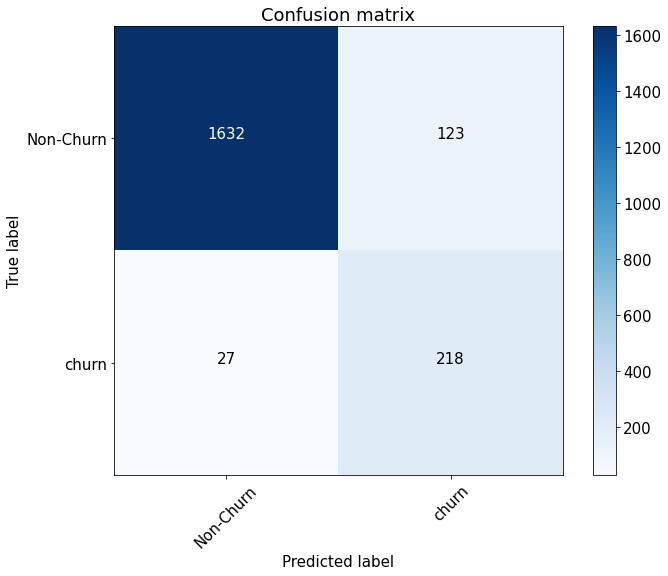

In [37]:
#мы уже нашли ранее "оптимальный" порог, когда максимизировали f_score
import itertools

font = {'size' : 15}

plt.rc('font', **font)

cnf_matrix = confusion_matrix(y_test, preds>thresholds[ix])
plt.figure(figsize=(10, 8))
plot_confusion_matrix(cnf_matrix, classes=['Non-Churn', 'churn'],
                      title='Confusion matrix')
plt.savefig("conf_matrix.png")
plt.show()

In [111]:
ra = roc_auc_score(y_test, preds)

df_results['roc_auc'] = (ra, )
ra

0.980391883249026

В целом мы видим, что получившиеся векторные представления содержат какой-то сигнал и позволяют решать нашу прикладную задачу. 

In [112]:
# Сохраняем датафрейм с результирующими данными для выбранного алгоритма, используемого в get_user_embedding

df_results.to_csv(df_results['embedding_method'][0] + '.csv')


In [123]:
# Сравниваем результаты для ранее проведенных вычислений для разных алгоритмов, используемых в get_user_embedding

dfs = [pd.read_csv(name + '.csv') for name in ('mean', 'median', 'max')]
pd.concat(dfs, ignore_index=True) 

,Unnamed: 0,embedding_method,threshold,fscore,precision,recall,roc_auc
0,0,mean,0.261143,0.746167,0.640351,0.893878,0.967384
1,0,median,0.382101,0.809816,0.811475,0.808163,0.978306
2,0,max,0.331815,0.812379,0.772059,0.857143,0.980392


Вывод: 
учитывая fscore и roc_auc, наиболее эффективным методом объединения векторов тематик является max; 
на мой взгляд, это связано с тем, что mean и median уменьшают значимость конкретной темы с ростом числа документов, в которых она встречается, тогда как max этого не делает;
это говорит о том, что пользователь в большинстве случаев воспринимает тему одинаково сильно независимо от числа документов, в которых она ему встретилась;

### Домашнее задание

1. Самостоятельно разобраться с тем, что такое tfidf (документация https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html и еще - https://scikit-learn.org/stable/modules/feature_extraction.html#text-feature-extraction)
2. Модифицировать код функции get_user_embedding таким образом, чтобы считалось не среднее (как в примере np.mean), а медиана. Применить такое преобразование к данным, обучить модель прогнозирования оттока и посчитать метрики качества и сохранить их: roc auc, precision/recall/f_score (для 3 последних - подобрать оптимальный порог с помощью precision_recall_curve, как это делалось на уроке)
3. Повторить п.2, но используя уже не медиану, а max
4. (опциональное, если очень хочется) Воспользовавшись полученными знаниями из п.1, повторить пункт 2, но уже взвешивая новости по tfidf (подсказка: нужно получить веса-коэффициенты для каждого документа. Не все документы одинаково информативны и несут какой-то положительный сигнал). Подсказка 2 - нужен именно idf, как вес.
5. Сформировать на выходе единую таблицу, сравнивающую качество 3 разных метода получения эмбедингов пользователей: mean, median, max, idf_mean по метрикам roc_auc, precision, recall, f_score
6. Сделать самостоятельные выводы и предположения о том, почему тот или ной способ оказался эффективнее остальных

#### Ссылки

1. http://www.machinelearning.ru/wiki/images/d/d5/Voron17survey-artm.pdf
2. https://en.wikipedia.org/wiki/Latent_Dirichlet_allocation

#### Библиотеки, которые нужно установить:

1. gensim
2. razdel
3. pymorphy2
4. nltk